# Importando bibliotecas

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

# Criando o Dataframe a partir dos arquivos csv disponibilizados

In [2]:
#Criando o dataframe
df = pd.read_csv(f".\\dl\\dados_A001_D_2001-01-01_2019-12-31.csv", sep=";", encoding="latin1", skiprows=10, decimal=",")


#Mostrando a quantidade de linhas e colunas do  dataframe
print(f"Quantidade linhas e colunas do datafram:",df.shape)


Quantidade linhas e colunas do datafram: (6939, 12)


In [3]:
#visualizando as primeiras linhas do dataframe
df.head()

,Data Medicao,"PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)",Unnamed: 11
0,2001-01-01,22.4,885.4,18.8,24.6,20.7,18.7,89.3,69.0,7.4,1.7,NaN
1,2001-01-02,37.2,885.9,18.3,24.7,20.7,18.5,87,67.0,9,2.4,NaN
2,2001-01-03,NaN,886.8,17.8,26.5,NaN,18.7,77.2,55.0,9,2.8,NaN
3,2001-01-04,NaN,888.5,17.5,26.3,NaN,17.4,80.2,59.0,10.1,3,NaN
4,2001-01-05,NaN,887.9,17,27.2,NaN,18.5,72.1,43.0,9.6,3.4,NaN


# Tratamento da base de dados

In [4]:
#Excluindo colunas desnecessárias do dataframe concatenado
df = df.drop(['Unnamed: 11'], axis=1)

df.head()

,Data Medicao,"PRECIPITACAO TOTAL, DIARIO (AUT)(mm)",PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)"
0,2001-01-01,22.4,885.4,18.8,24.6,20.7,18.7,89.3,69.0,7.4,1.7
1,2001-01-02,37.2,885.9,18.3,24.7,20.7,18.5,87,67.0,9,2.4
2,2001-01-03,NaN,886.8,17.8,26.5,NaN,18.7,77.2,55.0,9,2.8
3,2001-01-04,NaN,888.5,17.5,26.3,NaN,17.4,80.2,59.0,10.1,3
4,2001-01-05,NaN,887.9,17,27.2,NaN,18.5,72.1,43.0,9.6,3.4


In [5]:
#Verificando a existência de valores nulos
df.isna().sum()

Data Medicao                                                 0
PRECIPITACAO TOTAL, DIARIO (AUT)(mm)                       328
PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)                 227
TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)    226
TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)                      182
TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)                       307
TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)                      175
UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)              142
UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)              62
VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)                      84
VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)                  251
dtype: int64

In [6]:
#Excluindo valores nulos do dataframe
df = df.dropna()

#Verificando se sobrou algum valor nulo
df.isna().sum()

Data Medicao                                               0
PRECIPITACAO TOTAL, DIARIO (AUT)(mm)                       0
PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)                 0
TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)    0
TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)                      0
TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)                       0
TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)                      0
UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)              0
UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)             0
VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)                     0
VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)                  0
dtype: int64

In [7]:
#Renomeção de colunas
df.rename(columns={'PRECIPITACAO TOTAL, DIARIO (AUT)(mm)': 'PRECIPITACAO'}, inplace=True)

In [8]:
df_multi_classe = df.copy()

## DataFrame 2 classe

### Transformando a variável alvo em categórica e 2 classe 

In [9]:
# Convertendo valores da coluna PRECIPITACAO para números para realizar operações matemáticas
df['PRECIPITACAO'] = pd.to_numeric(df['PRECIPITACAO'])

# Transformando valores numéricos em categorias
df['PRECIPITACAO'] = np.where(df['PRECIPITACAO'] > 0, 'CHOVE', 'NÃO CHOVE')

df['PRECIPITACAO']

0           CHOVE
1           CHOVE
14      NÃO CHOVE
15      NÃO CHOVE
16      NÃO CHOVE
          ...    
6934    NÃO CHOVE
6935        CHOVE
6936    NÃO CHOVE
6937    NÃO CHOVE
6938    NÃO CHOVE
Name: PRECIPITACAO, Length: 6542, dtype: object

## DataFrame Multi Classe

### Transformando a variável alvo em categórica e multi classe 

In [10]:
# Convertendo a coluna 'PRECIPITACAO' para numérico
df_multi_classe['PRECIPITACAO'] = pd.to_numeric(df_multi_classe['PRECIPITACAO'])

# Definindo as condições e os valores correspondentes
condicoes = [
    (df_multi_classe['PRECIPITACAO'] == 0),
    (df_multi_classe['PRECIPITACAO'] > 0) & (df_multi_classe['PRECIPITACAO'] <= 20),
    (df_multi_classe['PRECIPITACAO'] > 20) & (df_multi_classe['PRECIPITACAO'] <= 40),
    (df_multi_classe['PRECIPITACAO'] > 40)
]

valores = [
    'SECO',
    'CHUVA LEVE',
    'CHUVA MODERADA',
    'CHUVA FORTE'
]

# Usando np.select para criar a nova coluna
df_multi_classe['PRECIPITACAO'] = np.select(condicoes, valores)

df_multi_classe['PRECIPITACAO'] = df_multi_classe['PRECIPITACAO'].astype(str)

# Exibindo a coluna resultante
print(df_multi_classe['PRECIPITACAO'])


0       CHUVA MODERADA
1       CHUVA MODERADA
14                SECO
15                SECO
16                SECO
             ...      
6934              SECO
6935        CHUVA LEVE
6936              SECO
6937              SECO
6938              SECO
Name: PRECIPITACAO, Length: 6542, dtype: object


In [49]:

df_multi_classe.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6542 entries, 0 to 6938
Data columns (total 11 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   Data Medicao                                             6542 non-null   object 
 1   PRECIPITACAO                                             6542 non-null   object 
 2   PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)               6542 non-null   object 
 3   TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)  6542 non-null   object 
 4   TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)                    6542 non-null   object 
 5   TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)                     6542 non-null   object 
 6   TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)                    6542 non-null   object 
 7   UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)            6542 non-null   object 
 8   UMIDADE RELATIVA DO AR, MINIMA DI

# Criando uma nova coluna que representa as estações e meses do ano para substituir nossa coluna de Data Medicao

## DataFrame 2 Classe

In [11]:
# Converter a coluna 'data' para o tipo datetime
df['Data Medicao'] = pd.to_datetime(df['Data Medicao'])

# Extrair o mês e o dia de cada data
df['mes'] = df['Data Medicao'].dt.month
df['dia'] = df['Data Medicao'].dt.day

# Determinar a estação do ano com base nas datas
def estacao_ano(mes, dia):
    if (mes == 3 and dia >= 21) or (mes == 4 or mes == 5) or (mes == 6 and dia < 21):
        return 'Outono'
    elif (mes == 6 and dia >= 21) or (mes == 7 or mes == 8) or (mes == 9 and dia < 22):
        return 'Inverno'
    elif (mes == 9 and dia >= 22) or (mes == 10 or mes == 11) or (mes == 12 and dia < 22):
        return 'Primavera'
    else:
        return 'Verão'

def meses_ano(mes):
    match mes:
        case 1:
            return 'Janeiro'
        case 2:
            return 'Fevereiro'
        case 3:
            return 'Março'
        case 4:
            return 'Abril'
        case 5:
            return 'Maio'
        case 6:
            return 'Junho'
        case 7:
            return 'Julho'
        case 8:
            return 'Agosto'
        case 9:
            return 'Setembro'
        case 10:
            return 'Outubro'
        case 11:
            return 'Novembro'
        case 12:
            return 'Dezembro'

# Aplicar a função estacao_ano para determinar a estação do ano de cada data
df['estacao'] = df.apply(lambda row: estacao_ano(row['mes'], row['dia']), axis=1)

# Aplicar a função meses_ano para determinar o mês de cada data
df['mes'] = df.apply(lambda row: meses_ano(row['mes']), axis = 1)



In [12]:
# Excluindo a ultimas colunas que não serão utilizadas
df = df.drop(['Data Medicao','dia'], axis=1)

In [13]:
df

,PRECIPITACAO,PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)",mes,estacao
0,CHOVE,885.4,18.8,24.6,20.7,18.7,89.3,69.0,7.4,1.7,Janeiro,Verão
1,CHOVE,885.9,18.3,24.7,20.7,18.5,87,67.0,9,2.4,Janeiro,Verão
14,NÃO CHOVE,888,14.4,27.2,22,17.8,63,41.0,10.8,3.8,Janeiro,Verão
15,NÃO CHOVE,887.9,13.7,26.3,21.8,17.7,61.2,35.0,10.6,4.3,Janeiro,Verão
16,NÃO CHOVE,888.1,15,27.4,21.9,18.1,66,41.0,8.4,3.5,Janeiro,Verão
...,...,...,...,...,...,...,...,...,...,...,...,...
6934,NÃO CHOVE,887,17,28.5,23.8,19.6,67.7,43.0,9.7,2.9,Dezembro,Verão
6935,CHOVE,886.4,15.4,29,23.9,19.3,60.5,32.0,8.9,3,Dezembro,Verão
6936,NÃO CHOVE,885.4,15.2,29.8,24.2,18.4,59.5,34.0,7.8,2.5,Dezembro,Verão
6937,NÃO CHOVE,884,15.1,29.1,24,18.4,58.7,38.0,8.1,2.2,Dezembro,Verão


In [14]:
# Transformando as colunas que são numérica para float
lista_colunas = ['PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)','TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)',
                 'TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)','TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)','TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)',
                 'UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)','UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)',
                 'VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)','VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)']

# Convertendo as colunas para o tipo float
df[lista_colunas] = df[lista_colunas].apply(pd.to_numeric, errors='coerce')

# Verificando as informações do DataFrame após a conversão
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6542 entries, 0 to 6938
Data columns (total 12 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   PRECIPITACAO                                             6542 non-null   object 
 1   PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)               6542 non-null   float64
 2   TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)  6542 non-null   float64
 3   TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)                    6542 non-null   float64
 4   TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)                     6542 non-null   float64
 5   TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)                    6542 non-null   float64
 6   UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)            6542 non-null   float64
 7   UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)           6542 non-null   float64
 8   VENTO, RAJADA MAXIMA DIARIA (AUT)

## DataFrame Multi Classe

In [15]:
# Converter a coluna 'data' para o tipo datetime
df_multi_classe['Data Medicao'] = pd.to_datetime(df_multi_classe['Data Medicao'])

# Extrair o mês e o dia de cada data
df_multi_classe['mes'] = df_multi_classe['Data Medicao'].dt.month
df_multi_classe['dia'] = df_multi_classe['Data Medicao'].dt.day

# Aplicar a função estacao_ano para determinar a estação do ano de cada data
df_multi_classe['estacao'] = df_multi_classe.apply(lambda row: estacao_ano(row['mes'], row['dia']), axis=1)

# Aplicar a função meses_ano para determinar o mês de cada data
df_multi_classe['mes'] = df_multi_classe.apply(lambda row: meses_ano(row['mes']), axis=1)


In [16]:
# Excluindo a ultimas colunas que não serão utilizadas
df_multi_classe = df_multi_classe.drop(['Data Medicao','dia'], axis=1)

In [18]:
df_multi_classe

,PRECIPITACAO,PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)",mes,estacao
0,CHUVA MODERADA,885.4,18.8,24.6,20.7,18.7,89.3,69.0,7.4,1.7,Janeiro,Verão
1,CHUVA MODERADA,885.9,18.3,24.7,20.7,18.5,87,67.0,9,2.4,Janeiro,Verão
14,SECO,888,14.4,27.2,22,17.8,63,41.0,10.8,3.8,Janeiro,Verão
15,SECO,887.9,13.7,26.3,21.8,17.7,61.2,35.0,10.6,4.3,Janeiro,Verão
16,SECO,888.1,15,27.4,21.9,18.1,66,41.0,8.4,3.5,Janeiro,Verão
...,...,...,...,...,...,...,...,...,...,...,...,...
6934,SECO,887,17,28.5,23.8,19.6,67.7,43.0,9.7,2.9,Dezembro,Verão
6935,CHUVA LEVE,886.4,15.4,29,23.9,19.3,60.5,32.0,8.9,3,Dezembro,Verão
6936,SECO,885.4,15.2,29.8,24.2,18.4,59.5,34.0,7.8,2.5,Dezembro,Verão
6937,SECO,884,15.1,29.1,24,18.4,58.7,38.0,8.1,2.2,Dezembro,Verão


In [19]:
# Transformando as colunas que são numérica para float
lista_colunas = ['PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)','TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)',
                 'TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)','TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)','TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)',
                 'UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)','UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)',
                 'VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)','VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)']

# Convertendo as colunas para o tipo float
df_multi_classe[lista_colunas] = df_multi_classe[lista_colunas].apply(pd.to_numeric, errors='coerce')

# Verificando as informações do DataFrame após a conversão
df_multi_classe.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6542 entries, 0 to 6938
Data columns (total 12 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   PRECIPITACAO                                             6542 non-null   object 
 1   PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)               6542 non-null   float64
 2   TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)  6542 non-null   float64
 3   TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)                    6542 non-null   float64
 4   TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)                     6542 non-null   float64
 5   TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)                    6542 non-null   float64
 6   UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)            6542 non-null   float64
 7   UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)           6542 non-null   float64
 8   VENTO, RAJADA MAXIMA DIARIA (AUT)

# Visualizando a distribuição dos atributos dos nossos DataFrame

## DataFrame 2 Classe

### Visualização das variáveis categóricas independentes 

In [20]:
#Visualizando a distribuição da coluna de estacao com base na precipitação
px.histogram(df, x='estacao',color = 'PRECIPITACAO', text_auto= True, barmode= 'group')

In [21]:
#Visualizando a distribuição da coluna de mes com base na precipitação
px.histogram(df, x='mes',color = 'PRECIPITACAO', text_auto= True,barmode= 'group')

### Visualização das variáveis numéricas independentes

In [22]:
#visualizando a distribuição da coluna de PRESSAO ATMOSFERICA MEDIA DIARIA com base na precipitação
px.box(df, x ='PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)', color = 'PRECIPITACAO' )

In [23]:
# visualizando a distribuição da coluna de TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C) com base na precipitação
px.box(df, x ='TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)', color = 'PRECIPITACAO' )

In [24]:
# visualizando a distribuição da coluna de TEMPERATURA MEDIA, DIARIA (AUT)(Â°C) com base na precipitação
px.box(df, x ='TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)', color = 'PRECIPITACAO' )

In [25]:
# visualizando a distribuição da coluna de TEMPERATURA MINIMA, DIARIA (AUT)(Â°C) com base na precipitação
px.box(df, x ='TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)', color = 'PRECIPITACAO' )

In [26]:
# visualizando a distribuição da coluna de TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA com base na precipitação
px.box(df, x ='TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)', color = 'PRECIPITACAO' )

In [27]:
# visualizando a distribuição da coluna de UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%) com base na precipitação
px.box(df, x ='UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)', color = 'PRECIPITACAO' )

In [28]:
# visualizando a distribuição da coluna de UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%) com base na precipitação
px.box(df, x ='UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)', color = 'PRECIPITACAO' )

In [29]:
# visualizando a distribuição da coluna de VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s) com base na precipitação
px.box(df, x ='VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)', color = 'PRECIPITACAO' )

In [30]:
# visualizando a distribuição da coluna de VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)com base na precipitação
px.box(df, x ='VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)', color = 'PRECIPITACAO' )

### Visualização da variável categórica alvo

In [31]:
#Visualizando a distribuição da precipitação
px.histogram(df, x='PRECIPITACAO',text_auto=True, title='Distribuição de chuva em Brasília de 2001 a 2019')

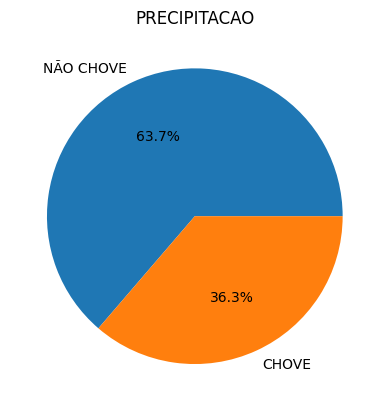

In [32]:
import matplotlib.pyplot as plt

# Count the occurrences of 'CHOVE' and 'NÃO CHOVE'
counts = df['PRECIPITACAO'].value_counts()

# Create a pie chart
plt.pie(counts, labels=counts.index, autopct='%1.1f%%')

# Add a title
plt.title('PRECIPITACAO')

# Display the chart
plt.show()


## DataFrame Multi Classe

### Visualização das variáveis categóricas independentes 

In [33]:
#Visualizando a distribuição da coluna de estacao com base na precipitação
px.histogram(df_multi_classe, x='estacao',color = 'PRECIPITACAO', text_auto= True, barmode= 'group')

In [34]:
#Visualizando a distribuição da coluna de mes com base na precipitação
px.histogram(df_multi_classe, x='mes',color = 'PRECIPITACAO', text_auto= True,barmode= 'group')

### Visualização das variáveis numéricas independentes

In [35]:
#visualizando a distribuição da coluna de PRESSAO ATMOSFERICA MEDIA DIARIA com base na precipitação
px.box(df_multi_classe, x ='PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)', color = 'PRECIPITACAO' )

In [36]:
# visualizando a distribuição da coluna de TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C) com base na precipitação
px.box(df_multi_classe, x ='TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)', color = 'PRECIPITACAO' )

In [37]:
# visualizando a distribuição da coluna de TEMPERATURA MEDIA, DIARIA (AUT)(Â°C) com base na precipitação
px.box(df_multi_classe, x ='TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)', color = 'PRECIPITACAO' )

In [38]:
# visualizando a distribuição da coluna de TEMPERATURA MINIMA, DIARIA (AUT)(Â°C) com base na precipitação
px.box(df_multi_classe, x ='TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)', color = 'PRECIPITACAO' )

In [39]:
# visualizando a distribuição da coluna de TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA com base na precipitação
px.box(df_multi_classe, x ='TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)', color = 'PRECIPITACAO' )

In [40]:
# visualizando a distribuição da coluna de UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%) com base na precipitação
px.box(df_multi_classe, x ='UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)', color = 'PRECIPITACAO' )

In [41]:
# visualizando a distribuição da coluna de UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%) com base na precipitação
px.box(df_multi_classe, x ='UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)', color = 'PRECIPITACAO' )

In [42]:
# visualizando a distribuição da coluna de VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s) com base na precipitação
px.box(df_multi_classe, x ='VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)', color = 'PRECIPITACAO' )

In [43]:
# visualizando a distribuição da coluna de VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)com base na precipitação
px.box(df_multi_classe, x ='VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)', color = 'PRECIPITACAO' )

### Visualização da variável categórica alvo

In [44]:
#Visualizando a distribuição da precipitação
px.histogram(df_multi_classe, x='PRECIPITACAO',text_auto=True, title='Distribuição de chuva em Brasília de 2001 a 2019')

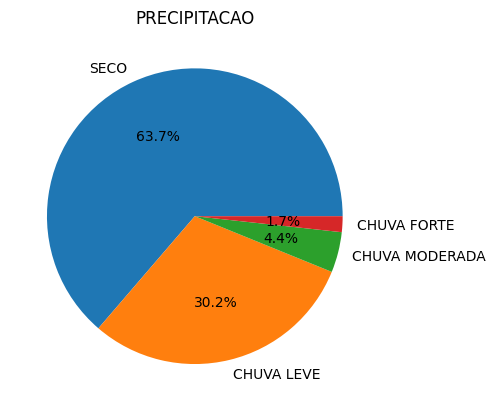

In [45]:
import matplotlib.pyplot as plt

# Count the occurrences of 'CHOVE' and 'NÃO CHOVE'
counts = df_multi_classe['PRECIPITACAO'].value_counts()

# Create a pie chart
plt.pie(counts, labels=counts.index, autopct='%1.1f%%')

# Add a title
plt.title('PRECIPITACAO')

# Display the chart
plt.show()


# Utilizando Z-Score para validação da base que será utilizada no modelo

## DataFrame 2 Classe

In [46]:
z_scores = df.drop(['PRECIPITACAO','estacao','mes'], axis=1)

In [47]:
z_scores

,PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)"
0,885.4,18.8,24.6,20.7,18.7,89.3,69.0,7.4,1.7
1,885.9,18.3,24.7,20.7,18.5,87.0,67.0,9.0,2.4
14,888.0,14.4,27.2,22.0,17.8,63.0,41.0,10.8,3.8
15,887.9,13.7,26.3,21.8,17.7,61.2,35.0,10.6,4.3
16,888.1,15.0,27.4,21.9,18.1,66.0,41.0,8.4,3.5
...,...,...,...,...,...,...,...,...,...
6934,887.0,17.0,28.5,23.8,19.6,67.7,43.0,9.7,2.9
6935,886.4,15.4,29.0,23.9,19.3,60.5,32.0,8.9,3.0
6936,885.4,15.2,29.8,24.2,18.4,59.5,34.0,7.8,2.5
6937,884.0,15.1,29.1,24.0,18.4,58.7,38.0,8.1,2.2


In [48]:
z_scores.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6542 entries, 0 to 6938
Data columns (total 9 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)               6542 non-null   float64
 1   TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)  6542 non-null   float64
 2   TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)                    6542 non-null   float64
 3   TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)                     6542 non-null   float64
 4   TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)                    6542 non-null   float64
 5   UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)            6542 non-null   float64
 6   UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)           6542 non-null   float64
 7   VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)                   6542 non-null   float64
 8   VENTO, VELOCIDADE MEDIA DIARIA (AU

In [49]:
from scipy.stats import zscore
# Calcule os z-values para todas as colunas numéricas
z_scores = zscore(z_scores)

# Converta os z-values em um DataFrame
z_scores_df = pd.DataFrame(z_scores)

In [50]:
z_scores_df

,PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)"
0,-0.849536,1.243676,-1.073781,-0.365656,0.891094,1.477264,1.947410,-0.772842,-0.955897
1,-0.628624,1.120214,-1.032057,-0.365656,0.799855,1.333601,1.806270,0.045560,0.003225
14,0.299207,0.157213,0.011040,0.314236,0.480521,-0.165493,-0.028543,0.966262,1.921471
15,0.255025,-0.015634,-0.364475,0.209637,0.434902,-0.277926,-0.451961,0.863962,2.606558
16,0.343390,0.305367,0.094488,0.261937,0.617379,0.021893,-0.028543,-0.261341,1.510418
...,...,...,...,...,...,...,...,...,...
6934,-0.142617,0.799213,0.553450,1.255624,1.301666,0.128079,0.112597,0.403611,0.688313
6935,-0.407712,0.404136,0.762070,1.307924,1.164809,-0.321649,-0.663670,-0.005590,0.825330
6936,-0.849536,0.354751,1.095861,1.464822,0.754236,-0.384111,-0.522531,-0.568242,0.140243
6937,-1.468091,0.330059,0.803794,1.360223,0.754236,-0.434081,-0.240252,-0.414791,-0.270810


In [86]:
print(max(z_scores_df))

VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)


In [87]:
print(max(z_scores_df['VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)']))

4.250768295101631


In [88]:
print(min(z_scores_df))

PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)


In [89]:
print(min(z_scores_df['PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)']))

-3.544666044847895


### Identificação dos índices dos outliers


In [90]:
# Encontrando os índices das linhas onde todos os valores estão dentro do intervalo (-3, 3)
indices_dentro_intervalo = z_scores_df[((z_scores_df >= -3) | (z_scores_df <= 3)).all(axis=1)].index


In [91]:
indices_dentro_intervalo

Index([   0,    1,   14,   15,   16,   25,   26,   27,   28,   29,
       ...
       6929, 6930, 6931, 6932, 6933, 6934, 6935, 6936, 6937, 6938],
      dtype='int64', length=6542)

In [55]:
indices_fora_intervalo = z_scores_df[((z_scores_df < -3) | (z_scores_df > 3)).any(axis=1)].index

In [56]:
indices_fora_intervalo

Index([  88,  214,  215,  287,  289,  305,  334,  413,  476,  549,
       ...
       6765, 6792, 6835, 6837, 6838, 6881, 6884, 6900, 6905, 6921],
      dtype='int64', length=228)

In [94]:
z_scores_df.loc[indices_dentro_intervalo]


,PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)"
0,-0.849536,1.243676,-1.073781,-0.365656,0.891094,1.477264,1.947410,-0.772842,-0.955897
1,-0.628624,1.120214,-1.032057,-0.365656,0.799855,1.333601,1.806270,0.045560,0.003225
14,0.299207,0.157213,0.011040,0.314236,0.480521,-0.165493,-0.028543,0.966262,1.921471
15,0.255025,-0.015634,-0.364475,0.209637,0.434902,-0.277926,-0.451961,0.863962,2.606558
16,0.343390,0.305367,0.094488,0.261937,0.617379,0.021893,-0.028543,-0.261341,1.510418
...,...,...,...,...,...,...,...,...,...
6934,-0.142617,0.799213,0.553450,1.255624,1.301666,0.128079,0.112597,0.403611,0.688313
6935,-0.407712,0.404136,0.762070,1.307924,1.164809,-0.321649,-0.663670,-0.005590,0.825330
6936,-0.849536,0.354751,1.095861,1.464822,0.754236,-0.384111,-0.522531,-0.568242,0.140243
6937,-1.468091,0.330059,0.803794,1.360223,0.754236,-0.434081,-0.240252,-0.414791,-0.270810


In [61]:
z_scores_df.loc[indices_fora_intervalo]

,PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)"
88,0.255025,0.897983,-0.573094,-0.836350,0.343664,1.327354,1.665131,3.728370,-0.955897
214,2.243235,-1.373712,-1.073781,-1.359344,-1.161768,-0.908794,-0.451961,2.091565,3.291646
215,2.154871,-1.077404,-1.032057,-1.202446,-1.344245,-0.571498,-0.804810,1.375463,3.291646
287,-0.142617,0.354751,-3.493765,-2.091535,-0.021289,1.333601,2.441398,-0.823993,0.414278
289,-0.761171,0.700444,-3.285146,-1.777739,-0.066909,1.633419,2.794246,-1.284344,-0.270810
...,...,...,...,...,...,...,...,...,...
6881,-1.026266,0.675752,1.262756,0.418835,0.891094,0.409159,-0.240252,4.546772,-0.818880
6884,-0.849536,0.922675,0.261383,0.261937,-0.477481,0.740209,0.042027,5.109423,-0.955897
6900,-0.584442,0.897983,0.011040,-0.313357,0.298045,1.033782,0.536015,3.677219,-0.818880
6905,-0.937901,1.144906,-0.072408,0.471134,1.484143,0.871380,1.171143,3.932970,0.003225


In [62]:
z_scores_df = z_scores_df.drop(indices_fora_intervalo)


In [97]:
print(max(z_scores_df))

VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)


In [98]:
#Verificando se sobrou algum valor acima de 3 e abaixo de -3
print(max(z_scores_df['VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)']))

2.8805931740628408


In [99]:
print(min(z_scores_df))

PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)


In [100]:
print(min(z_scores_df['PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)']))


-2.970294140345195


### Removendo os outlier dos dataframes originais com base nos indices encontrados

In [63]:
df = df.drop(indices_fora_intervalo)
df

,PRECIPITACAO,PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)",mes,estacao
0,CHOVE,885.4,18.8,24.6,20.7,18.7,89.3,69.0,7.4,1.7,Janeiro,Verão
1,CHOVE,885.9,18.3,24.7,20.7,18.5,87.0,67.0,9.0,2.4,Janeiro,Verão
14,NÃO CHOVE,888.0,14.4,27.2,22.0,17.8,63.0,41.0,10.8,3.8,Janeiro,Verão
15,NÃO CHOVE,887.9,13.7,26.3,21.8,17.7,61.2,35.0,10.6,4.3,Janeiro,Verão
16,NÃO CHOVE,888.1,15.0,27.4,21.9,18.1,66.0,41.0,8.4,3.5,Janeiro,Verão
...,...,...,...,...,...,...,...,...,...,...,...,...
6934,NÃO CHOVE,887.0,17.0,28.5,23.8,19.6,67.7,43.0,9.7,2.9,Dezembro,Verão
6935,CHOVE,886.4,15.4,29.0,23.9,19.3,60.5,32.0,8.9,3.0,Dezembro,Verão
6936,NÃO CHOVE,885.4,15.2,29.8,24.2,18.4,59.5,34.0,7.8,2.5,Dezembro,Verão
6937,NÃO CHOVE,884.0,15.1,29.1,24.0,18.4,58.7,38.0,8.1,2.2,Dezembro,Verão


## DataFrame Multi Classe

In [51]:
z_scores_multi_classe = df_multi_classe.drop(['PRECIPITACAO','estacao','mes'], axis=1)

In [52]:
z_scores_multi_classe.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6542 entries, 0 to 6938
Data columns (total 9 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)               6542 non-null   float64
 1   TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)  6542 non-null   float64
 2   TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)                    6542 non-null   float64
 3   TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)                     6542 non-null   float64
 4   TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)                    6542 non-null   float64
 5   UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)            6542 non-null   float64
 6   UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)           6542 non-null   float64
 7   VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)                   6542 non-null   float64
 8   VENTO, VELOCIDADE MEDIA DIARIA (AU

In [53]:
from scipy.stats import zscore
# Calcule os z-values para todas as colunas numéricas
z_scores_multi_classe = zscore(z_scores_multi_classe)

# Converta os z-values em um DataFrame
z_scores_multi_classe = pd.DataFrame(z_scores_multi_classe)

In [54]:
z_scores_multi_classe

,PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)"
0,-0.849536,1.243676,-1.073781,-0.365656,0.891094,1.477264,1.947410,-0.772842,-0.955897
1,-0.628624,1.120214,-1.032057,-0.365656,0.799855,1.333601,1.806270,0.045560,0.003225
14,0.299207,0.157213,0.011040,0.314236,0.480521,-0.165493,-0.028543,0.966262,1.921471
15,0.255025,-0.015634,-0.364475,0.209637,0.434902,-0.277926,-0.451961,0.863962,2.606558
16,0.343390,0.305367,0.094488,0.261937,0.617379,0.021893,-0.028543,-0.261341,1.510418
...,...,...,...,...,...,...,...,...,...
6934,-0.142617,0.799213,0.553450,1.255624,1.301666,0.128079,0.112597,0.403611,0.688313
6935,-0.407712,0.404136,0.762070,1.307924,1.164809,-0.321649,-0.663670,-0.005590,0.825330
6936,-0.849536,0.354751,1.095861,1.464822,0.754236,-0.384111,-0.522531,-0.568242,0.140243
6937,-1.468091,0.330059,0.803794,1.360223,0.754236,-0.434081,-0.240252,-0.414791,-0.270810


### Identificação dos índices dos outliers


In [57]:
indices_fora_intervalo_multi_class = z_scores_multi_classe[((z_scores_multi_classe < -3) | (z_scores_multi_classe > 3)).any(axis=1)].index

In [58]:
indices_fora_intervalo_multi_class

Index([  88,  214,  215,  287,  289,  305,  334,  413,  476,  549,
       ...
       6765, 6792, 6835, 6837, 6838, 6881, 6884, 6900, 6905, 6921],
      dtype='int64', length=228)

In [59]:
z_scores_multi_classe = z_scores_multi_classe.drop(indices_fora_intervalo)

### Removendo os outlier dos dataframes originais com base nos indices encontrados

In [60]:
df_multi_classe = df_multi_classe.drop(indices_fora_intervalo)
df_multi_classe

,PRECIPITACAO,PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)",mes,estacao
0,CHUVA MODERADA,885.4,18.8,24.6,20.7,18.7,89.3,69.0,7.4,1.7,Janeiro,Verão
1,CHUVA MODERADA,885.9,18.3,24.7,20.7,18.5,87.0,67.0,9.0,2.4,Janeiro,Verão
14,SECO,888.0,14.4,27.2,22.0,17.8,63.0,41.0,10.8,3.8,Janeiro,Verão
15,SECO,887.9,13.7,26.3,21.8,17.7,61.2,35.0,10.6,4.3,Janeiro,Verão
16,SECO,888.1,15.0,27.4,21.9,18.1,66.0,41.0,8.4,3.5,Janeiro,Verão
...,...,...,...,...,...,...,...,...,...,...,...,...
6934,SECO,887.0,17.0,28.5,23.8,19.6,67.7,43.0,9.7,2.9,Dezembro,Verão
6935,CHUVA LEVE,886.4,15.4,29.0,23.9,19.3,60.5,32.0,8.9,3.0,Dezembro,Verão
6936,SECO,885.4,15.2,29.8,24.2,18.4,59.5,34.0,7.8,2.5,Dezembro,Verão
6937,SECO,884.0,15.1,29.1,24.0,18.4,58.7,38.0,8.1,2.2,Dezembro,Verão


# Analisando a distribuição dos dados com Histograma

Tipos de histogramas: https://www.significados.com.br/histograma/

## Utilizando Histograma para visualizar a distribuição de cada variável do DataFrame

In [554]:
df

,PRECIPITACAO,PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)",mes,estacao
0,CHOVE,885.4,18.8,24.6,20.7,18.7,89.3,69.0,7.4,1.7,Janeiro,Verão
1,CHOVE,885.9,18.3,24.7,20.7,18.5,87.0,67.0,9.0,2.4,Janeiro,Verão
14,NÃO CHOVE,888.0,14.4,27.2,22.0,17.8,63.0,41.0,10.8,3.8,Janeiro,Verão
15,NÃO CHOVE,887.9,13.7,26.3,21.8,17.7,61.2,35.0,10.6,4.3,Janeiro,Verão
16,NÃO CHOVE,888.1,15.0,27.4,21.9,18.1,66.0,41.0,8.4,3.5,Janeiro,Verão
...,...,...,...,...,...,...,...,...,...,...,...,...
6934,NÃO CHOVE,887.0,17.0,28.5,23.8,19.6,67.7,43.0,9.7,2.9,Dezembro,Verão
6935,CHOVE,886.4,15.4,29.0,23.9,19.3,60.5,32.0,8.9,3.0,Dezembro,Verão
6936,NÃO CHOVE,885.4,15.2,29.8,24.2,18.4,59.5,34.0,7.8,2.5,Dezembro,Verão
6937,NÃO CHOVE,884.0,15.1,29.1,24.0,18.4,58.7,38.0,8.1,2.2,Dezembro,Verão


variavel = 'PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)'

Gráfico do tipo Despenhadeiro:
No despenhadeiro os valores mais altos ficam localizados em uma das extremidades de histograma.

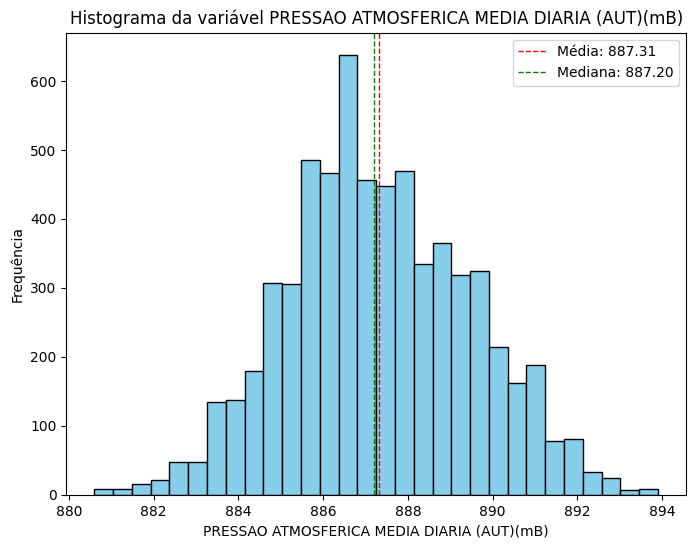

In [555]:
variavel = 'PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)'
# Crie o histograma para a variável escolhida
plt.figure(figsize=(8, 6))  # Define o tamanho da figura
plt.hist(df[variavel].apply(pd.to_numeric, errors='coerce'), bins=30, color='skyblue', edgecolor='black')  # Plota o histograma

# Calcula a média e mediana dos dados
mean_value = df[variavel].apply(pd.to_numeric, errors='coerce').mean()
median_value = df[variavel].apply(pd.to_numeric, errors='coerce').median()

# Adiciona linha para a média
plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=1, label=f'Média: {mean_value:.2f}')

# Adiciona linha para a mediana
plt.axvline(median_value, color='green', linestyle='dashed', linewidth=1, label=f'Mediana: {median_value:.2f}')

plt.title(f'Histograma da variável {variavel}')  # Adiciona título ao gráfico
plt.xlabel(variavel)  # Adiciona título do eixo x
plt.ylabel('Frequência')  # Adiciona título do eixo y
plt.legend()  # Adiciona a legenda
plt.show()  # Mostra o histograma

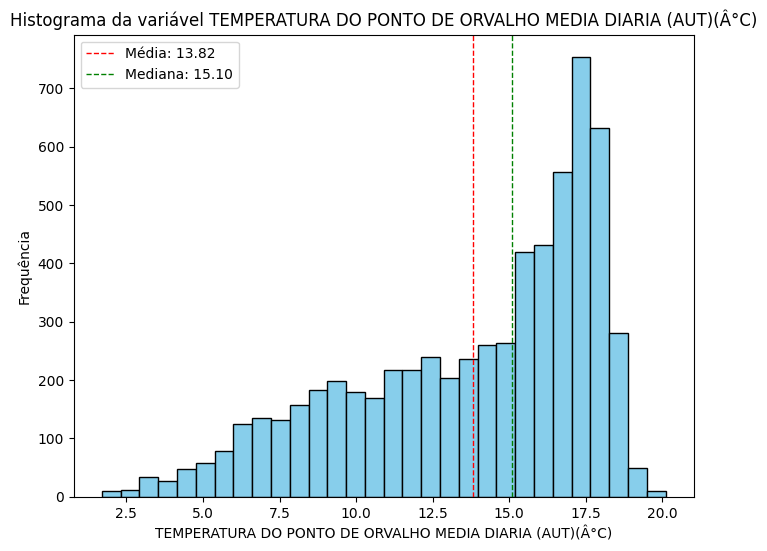

In [556]:
variavel = 'TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)'
# Crie o histograma para a variável escolhida
plt.figure(figsize=(8, 6))  # Define o tamanho da figura
plt.hist(df[variavel].apply(pd.to_numeric, errors='coerce'), bins=30, color='skyblue', edgecolor='black')  # Plota o histograma

# Calcula a média e mediana dos dados
mean_value = df[variavel].apply(pd.to_numeric, errors='coerce').mean()
median_value = df[variavel].apply(pd.to_numeric, errors='coerce').median()

# Adiciona linha para a média
plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=1, label=f'Média: {mean_value:.2f}')

# Adiciona linha para a mediana
plt.axvline(median_value, color='green', linestyle='dashed', linewidth=1, label=f'Mediana: {median_value:.2f}')

plt.title(f'Histograma da variável {variavel}')  # Adiciona título ao gráfico
plt.xlabel(variavel)  # Adiciona título do eixo x
plt.ylabel('Frequência')  # Adiciona título do eixo y
plt.legend()  # Adiciona a legenda
plt.show()  # Mostra o histograma

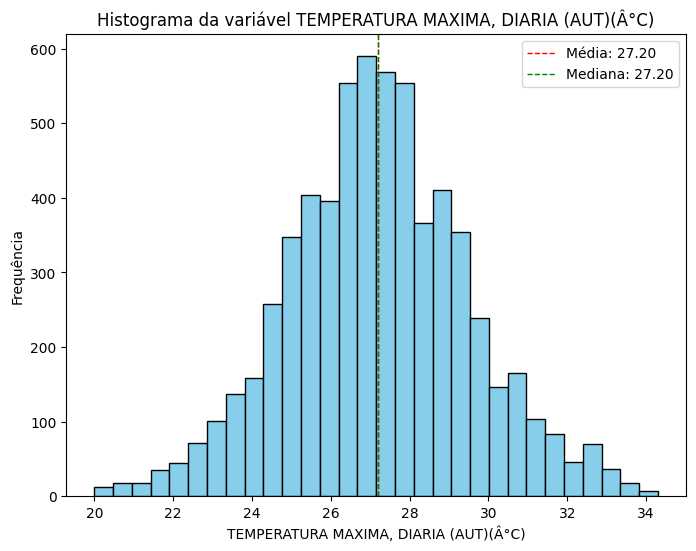

In [557]:
variavel = 'TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)'
# Crie o histograma para a variável escolhida
plt.figure(figsize=(8, 6))  # Define o tamanho da figura
plt.hist(df[variavel].apply(pd.to_numeric, errors='coerce'), bins=30, color='skyblue', edgecolor='black')  # Plota o histograma

# Calcula a média e mediana dos dados
mean_value = df[variavel].apply(pd.to_numeric, errors='coerce').mean()
median_value = df[variavel].apply(pd.to_numeric, errors='coerce').median()

# Adiciona linha para a média
plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=1, label=f'Média: {mean_value:.2f}')

# Adiciona linha para a mediana
plt.axvline(median_value, color='green', linestyle='dashed', linewidth=1, label=f'Mediana: {median_value:.2f}')

plt.title(f'Histograma da variável {variavel}')  # Adiciona título ao gráfico
plt.xlabel(variavel)  # Adiciona título do eixo x
plt.ylabel('Frequência')  # Adiciona título do eixo y
plt.legend()  # Adiciona a legenda
plt.show()  # Mostra o histograma

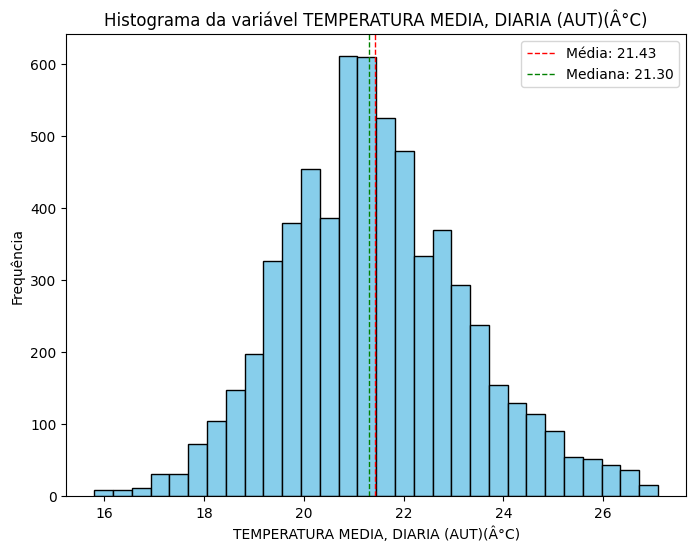

In [558]:
variavel = 'TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)'
# Crie o histograma para a variável escolhida
plt.figure(figsize=(8, 6))  # Define o tamanho da figura
plt.hist(df[variavel].apply(pd.to_numeric, errors='coerce'), bins=30, color='skyblue', edgecolor='black')  # Plota o histograma

# Calcula a média e mediana dos dados
mean_value = df[variavel].apply(pd.to_numeric, errors='coerce').mean()
median_value = df[variavel].apply(pd.to_numeric, errors='coerce').median()

# Adiciona linha para a média
plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=1, label=f'Média: {mean_value:.2f}')

# Adiciona linha para a mediana
plt.axvline(median_value, color='green', linestyle='dashed', linewidth=1, label=f'Mediana: {median_value:.2f}')

plt.title(f'Histograma da variável {variavel}')  # Adiciona título ao gráfico
plt.xlabel(variavel)  # Adiciona título do eixo x
plt.ylabel('Frequência')  # Adiciona título do eixo y
plt.legend()  # Adiciona a legenda
plt.show()  # Mostra o histograma

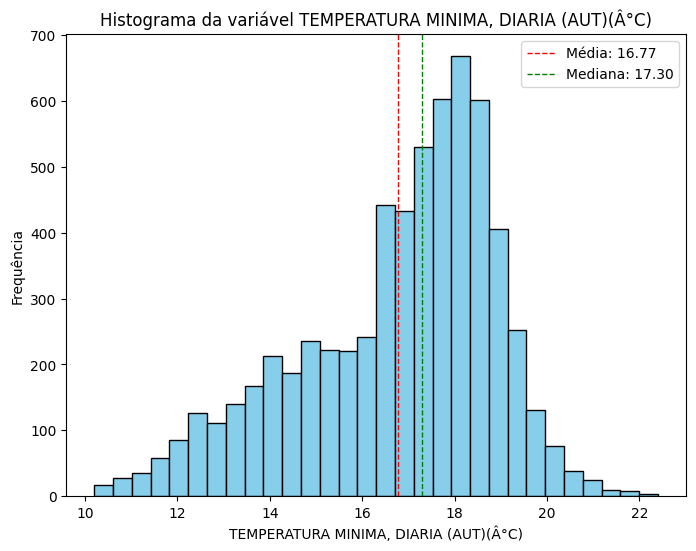

In [559]:
variavel = 'TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)'
# Crie o histograma para a variável escolhida
plt.figure(figsize=(8, 6))  # Define o tamanho da figura
plt.hist(df[variavel].apply(pd.to_numeric, errors='coerce'), bins=30, color='skyblue', edgecolor='black')  # Plota o histograma

# Calcula a média e mediana dos dados
mean_value = df[variavel].apply(pd.to_numeric, errors='coerce').mean()
median_value = df[variavel].apply(pd.to_numeric, errors='coerce').median()

# Adiciona linha para a média
plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=1, label=f'Média: {mean_value:.2f}')

# Adiciona linha para a mediana
plt.axvline(median_value, color='green', linestyle='dashed', linewidth=1, label=f'Mediana: {median_value:.2f}')

plt.title(f'Histograma da variável {variavel}')  # Adiciona título ao gráfico
plt.xlabel(variavel)  # Adiciona título do eixo x
plt.ylabel('Frequência')  # Adiciona título do eixo y
plt.legend()  # Adiciona a legenda
plt.show()  # Mostra o histograma

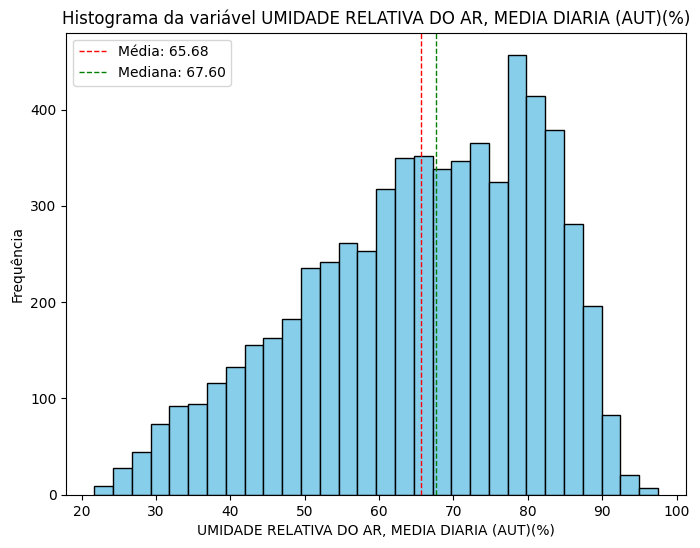

In [560]:
variavel = 'UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)'
# Crie o histograma para a variável escolhida
plt.figure(figsize=(8, 6))  # Define o tamanho da figura
plt.hist(df[variavel].apply(pd.to_numeric, errors='coerce'), bins=30, color='skyblue', edgecolor='black')  # Plota o histograma

# Calcula a média e mediana dos dados
mean_value = df[variavel].apply(pd.to_numeric, errors='coerce').mean()
median_value = df[variavel].apply(pd.to_numeric, errors='coerce').median()

# Adiciona linha para a média
plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=1, label=f'Média: {mean_value:.2f}')

# Adiciona linha para a mediana
plt.axvline(median_value, color='green', linestyle='dashed', linewidth=1, label=f'Mediana: {median_value:.2f}')

plt.title(f'Histograma da variável {variavel}')  # Adiciona título ao gráfico
plt.xlabel(variavel)  # Adiciona título do eixo x
plt.ylabel('Frequência')  # Adiciona título do eixo y
plt.legend()  # Adiciona a legenda
plt.show()  # Mostra o histograma

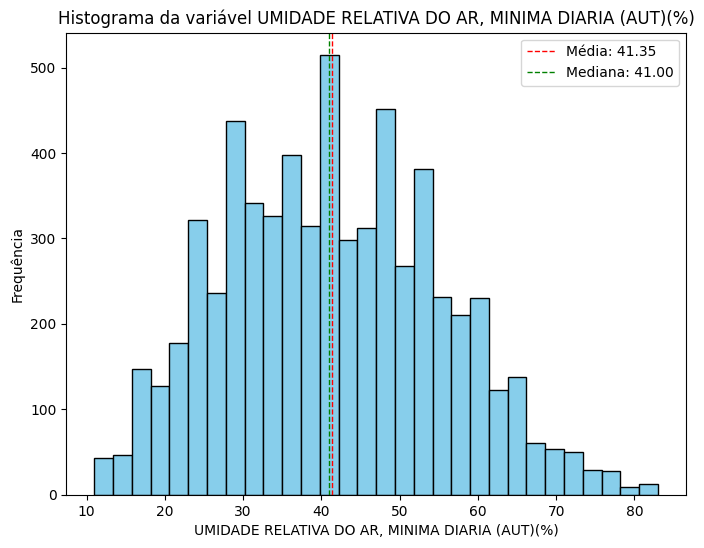

In [561]:
variavel = 'UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)'
# Crie o histograma para a variável escolhida
plt.figure(figsize=(8, 6))  # Define o tamanho da figura
plt.hist(df[variavel].apply(pd.to_numeric, errors='coerce'), bins=30, color='skyblue', edgecolor='black')  # Plota o histograma

# Calcula a média e mediana dos dados
mean_value = df[variavel].apply(pd.to_numeric, errors='coerce').mean()
median_value = df[variavel].apply(pd.to_numeric, errors='coerce').median()

# Adiciona linha para a média
plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=1, label=f'Média: {mean_value:.2f}')

# Adiciona linha para a mediana
plt.axvline(median_value, color='green', linestyle='dashed', linewidth=1, label=f'Mediana: {median_value:.2f}')

plt.title(f'Histograma da variável {variavel}')  # Adiciona título ao gráfico
plt.xlabel(variavel)  # Adiciona título do eixo x
plt.ylabel('Frequência')  # Adiciona título do eixo y
plt.legend()  # Adiciona a legenda
plt.show()  # Mostra o histograma

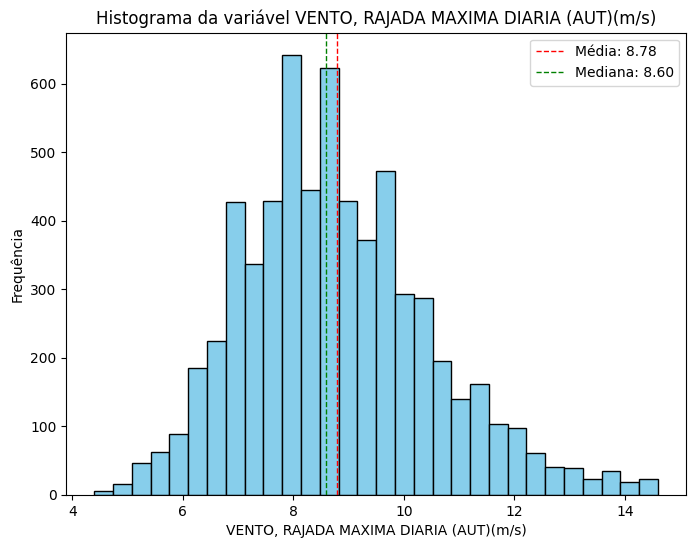

In [562]:
variavel = 'VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)'
# Crie o histograma para a variável escolhida
plt.figure(figsize=(8, 6))  # Define o tamanho da figura
plt.hist(df[variavel].apply(pd.to_numeric, errors='coerce'), bins=30, color='skyblue', edgecolor='black')  # Plota o histograma

# Calcula a média e mediana dos dados
mean_value = df[variavel].apply(pd.to_numeric, errors='coerce').mean()
median_value = df[variavel].apply(pd.to_numeric, errors='coerce').median()

# Adiciona linha para a média
plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=1, label=f'Média: {mean_value:.2f}')

# Adiciona linha para a mediana
plt.axvline(median_value, color='green', linestyle='dashed', linewidth=1, label=f'Mediana: {median_value:.2f}')

plt.title(f'Histograma da variável {variavel}')  # Adiciona título ao gráfico
plt.xlabel(variavel)  # Adiciona título do eixo x
plt.ylabel('Frequência')  # Adiciona título do eixo y
plt.legend()  # Adiciona a legenda
plt.show()  # Mostra o histograma

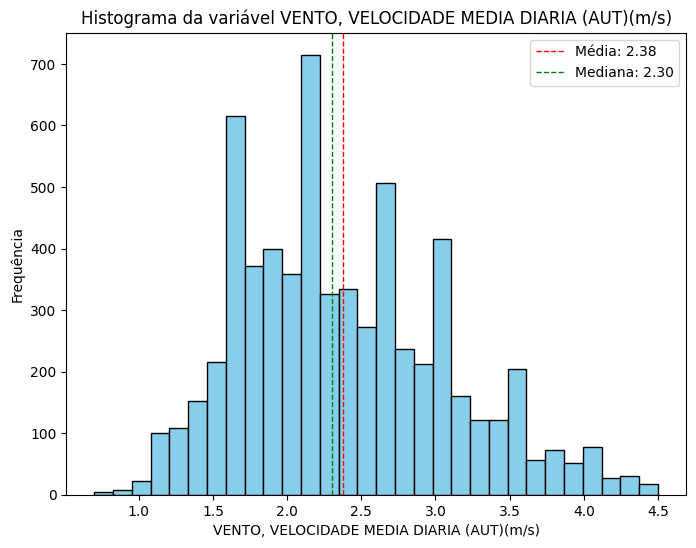

In [563]:
variavel = 'VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)'
# Crie o histograma para a variável escolhida
plt.figure(figsize=(8, 6))  # Define o tamanho da figura
plt.hist(df[variavel].apply(pd.to_numeric, errors='coerce'), bins=30, color='skyblue', edgecolor='black')  # Plota o histograma

# Calcula a média e mediana dos dados
mean_value = df[variavel].apply(pd.to_numeric, errors='coerce').mean()
median_value = df[variavel].apply(pd.to_numeric, errors='coerce').median()

# Adiciona linha para a média
plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=1, label=f'Média: {mean_value:.2f}')

# Adiciona linha para a mediana
plt.axvline(median_value, color='green', linestyle='dashed', linewidth=1, label=f'Mediana: {median_value:.2f}')

plt.title(f'Histograma da variável {variavel}')  # Adiciona título ao gráfico
plt.xlabel(variavel)  # Adiciona título do eixo x
plt.ylabel('Frequência')  # Adiciona título do eixo y
plt.legend()  # Adiciona a legenda
plt.show()  # Mostra o histograma

# Preparação/transformação do DataFrame para aplicar o modelo de Machine Learning

## Variáveis explicativas e variável alvo

Para fazer a previsão dos valores com um modelo de machine learning, precisamos fazer a separação da variável alvo e variáveis explicativas. O y representa a variável que queremos prever, enquanto x representa todas as variáveis que serão utilizadas para explicar o comportamento de y.

In [564]:
df

,PRECIPITACAO,PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)",mes,estacao
0,CHOVE,885.4,18.8,24.6,20.7,18.7,89.3,69.0,7.4,1.7,Janeiro,Verão
1,CHOVE,885.9,18.3,24.7,20.7,18.5,87.0,67.0,9.0,2.4,Janeiro,Verão
14,NÃO CHOVE,888.0,14.4,27.2,22.0,17.8,63.0,41.0,10.8,3.8,Janeiro,Verão
15,NÃO CHOVE,887.9,13.7,26.3,21.8,17.7,61.2,35.0,10.6,4.3,Janeiro,Verão
16,NÃO CHOVE,888.1,15.0,27.4,21.9,18.1,66.0,41.0,8.4,3.5,Janeiro,Verão
...,...,...,...,...,...,...,...,...,...,...,...,...
6934,NÃO CHOVE,887.0,17.0,28.5,23.8,19.6,67.7,43.0,9.7,2.9,Dezembro,Verão
6935,CHOVE,886.4,15.4,29.0,23.9,19.3,60.5,32.0,8.9,3.0,Dezembro,Verão
6936,NÃO CHOVE,885.4,15.2,29.8,24.2,18.4,59.5,34.0,7.8,2.5,Dezembro,Verão
6937,NÃO CHOVE,884.0,15.1,29.1,24.0,18.4,58.7,38.0,8.1,2.2,Dezembro,Verão


In [565]:
x = df.drop('PRECIPITACAO', axis = 1)
y = df['PRECIPITACAO']

In [566]:
x

,PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)",mes,estacao
0,885.4,18.8,24.6,20.7,18.7,89.3,69.0,7.4,1.7,Janeiro,Verão
1,885.9,18.3,24.7,20.7,18.5,87.0,67.0,9.0,2.4,Janeiro,Verão
14,888.0,14.4,27.2,22.0,17.8,63.0,41.0,10.8,3.8,Janeiro,Verão
15,887.9,13.7,26.3,21.8,17.7,61.2,35.0,10.6,4.3,Janeiro,Verão
16,888.1,15.0,27.4,21.9,18.1,66.0,41.0,8.4,3.5,Janeiro,Verão
...,...,...,...,...,...,...,...,...,...,...,...
6934,887.0,17.0,28.5,23.8,19.6,67.7,43.0,9.7,2.9,Dezembro,Verão
6935,886.4,15.4,29.0,23.9,19.3,60.5,32.0,8.9,3.0,Dezembro,Verão
6936,885.4,15.2,29.8,24.2,18.4,59.5,34.0,7.8,2.5,Dezembro,Verão
6937,884.0,15.1,29.1,24.0,18.4,58.7,38.0,8.1,2.2,Dezembro,Verão


In [567]:
y

0           CHOVE
1           CHOVE
14      NÃO CHOVE
15      NÃO CHOVE
16      NÃO CHOVE
          ...    
6934    NÃO CHOVE
6935        CHOVE
6936    NÃO CHOVE
6937    NÃO CHOVE
6938    NÃO CHOVE
Name: PRECIPITACAO, Length: 6314, dtype: object

### Explicação do por que é preciso transformar os dados


Os algoritmos de Machine Learning não conseguem compreender informações que não estejam em formato numérico. Portanto, se for o desejo de utilizar variáveis categóricas em modelos, é necessário que elas passem por algum tipo de tratamento para que fiquem em formato numérico. Isso não quer dizer que vão se tornar variáveis numéricas, apenas que estarão em um formato que seja compreendido pelos modelos.

Sendo assim, essas transformações precisam preservar a informação real das categorias da melhor forma possível, sem trazer vieses para o modelo e informações que estejam distantes da realidade.

A forma ideal de fazer esse tipo de transformação, que mantém a informação original, é conhecida como one hot encoding. Essa ação transforma cada uma das classes das variáveis categóricas em novas colunas, utilizando o valor 0 para representar a ausência da característica e 1 para a presença da característica na amostra da base de dados. Perceba em detalhes, o dinamismo desse processo na imagem a seguir.

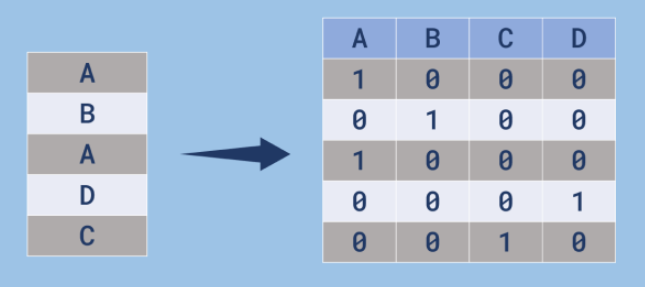



## Transformando as variáveis explicativas(independentes)

Os algoritmos de machine learning não compreendem dados no formato de texto, portanto devemos fazer transformações nos dados para o formato numérico para que o algoritmo consiga compreender as informações. Essa transformação precisa ser feita de forma que não altere a informação original do conjunto de dados, portanto não basta simplesmente alterar os valores para valores numéricos aleatórios.

In [568]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import make_column_transformer

#construindo o one_hot_encodes
# armazenando em one_hot a função capaz de fazer as transformações das colunas
# Primeiro parâmetro: vai ser um tupla passando o tipo de transformação e quais colunas aplicar a transformação

one_hot = make_column_transformer((
    # o Parametro passado para o OneHotEncoder: caso a coluna tenha apenas 2 categorias vamos remover uma das colunas geradas para não ter duplicidade
    OneHotEncoder(drop = 'if_binary'),
    # Passando as colunas para transformação
    ['estacao','mes']
),
# Passando o que sera feito com as demais colunas da base
  remainder = 'passthrough',
# utilizado para no processo de transformação as colunas mantenham todos os valores
  sparse_threshold = 0)

#Armazenando as colunas do dataframe das variaveis independentes
colunas = x.columns

x = one_hot.fit_transform(x)

#renomeando as colunas para os nomes orginais pois no processo de transformação os nomes serão alterados
#visualizando como ficou os nomes das colunas após a transformação
one_hot.get_feature_names_out(colunas)

array(['onehotencoder__estacao_Inverno', 'onehotencoder__estacao_Outono',
       'onehotencoder__estacao_Primavera', 'onehotencoder__estacao_Verão',
       'onehotencoder__mes_Abril', 'onehotencoder__mes_Agosto',
       'onehotencoder__mes_Dezembro', 'onehotencoder__mes_Fevereiro',
       'onehotencoder__mes_Janeiro', 'onehotencoder__mes_Julho',
       'onehotencoder__mes_Junho', 'onehotencoder__mes_Maio',
       'onehotencoder__mes_Março', 'onehotencoder__mes_Novembro',
       'onehotencoder__mes_Outubro', 'onehotencoder__mes_Setembro',
       'remainder__PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)',
       'remainder__TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)',
       'remainder__TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)',
       'remainder__TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)',
       'remainder__TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)',
       'remainder__UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)',
       'remainder__UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)',
    

In [569]:
type(x)

#transformando nossa variavel x em um dataframe denovo pois apos a transformação ele perdeu essa estrutura
x = pd.DataFrame(x, columns = one_hot.get_feature_names_out(colunas))

x.head()

,onehotencoder__estacao_Inverno,onehotencoder__estacao_Outono,onehotencoder__estacao_Primavera,onehotencoder__estacao_Verão,onehotencoder__mes_Abril,onehotencoder__mes_Agosto,onehotencoder__mes_Dezembro,onehotencoder__mes_Fevereiro,onehotencoder__mes_Janeiro,onehotencoder__mes_Julho,...,onehotencoder__mes_Setembro,remainder__PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),remainder__TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"remainder__TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","remainder__TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","remainder__TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","remainder__UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","remainder__UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","remainder__VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","remainder__VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)"
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,885.4,18.8,24.6,20.7,18.7,89.3,69.0,7.4,1.7
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,885.9,18.3,24.7,20.7,18.5,87.0,67.0,9.0,2.4
2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,888.0,14.4,27.2,22.0,17.8,63.0,41.0,10.8,3.8
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,887.9,13.7,26.3,21.8,17.7,61.2,35.0,10.6,4.3
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,888.1,15.0,27.4,21.9,18.1,66.0,41.0,8.4,3.5


## Transformando variavel alvo

Assim como as variáveis explicativas, a variável alvo também precisa ser

---

alterada para o formato numérico. Podemos representar uma variável alvo binária como 0 ou 1, onde 0 indica ausência da característica da variável e 1 representa a presença da característica.

In [570]:
#criando o objeto reponsavel por fazer a transformação do LabelEncoder
label_ecoder = LabelEncoder()

In [571]:
#Aplicando a função LabelEnconder na variavel alvo Y
# o label_encoder vai compreender quais categorias existem na base de dados e vamos transformar essas categorias para 0 e 1
y = label_ecoder.fit_transform(y)

In [572]:
y

array([0, 0, 1, ..., 1, 1, 1])

# Balanceando a base de Dados com NearMiss

### Funcionamento do NearMiss

O NearMiss funciona selecionando instâncias da classe majoritária com base na proximidade (distância) em relação às instâncias da classe minoritária. A ideia é manter as instâncias da classe majoritária que estão mais próximas (ou às vezes mais distantes, dependendo da variante do NearMiss) das instâncias da classe minoritária.

***NearMiss-1:***

Seleciona as instâncias da classe majoritária que têm as menores distâncias médias para as k instâncias mais próximas da classe minoritária.

***NearMiss-2:***

Seleciona as instâncias da classe majoritária que têm as menores distâncias médias para todas as instâncias da classe minoritária.
    
***NearMiss-3:***

Seleciona as instâncias da classe majoritária que têm as menores distâncias para as k instâncias mais distantes da classe minoritária.


Passos Básicos do NearMiss

***Calcular Distâncias:***

Calcula as distâncias entre as instâncias das classes majoritária e minoritária.

***Selecionar Instâncias:***

Com base na estratégia (NearMiss-1, NearMiss-2 ou NearMiss-3), seleciona as instâncias da classe majoritária que atendem ao critério de proximidade escolhido.

***Criar Conjunto Balanceado:***

Retém todas as instâncias da classe minoritária e as instâncias selecionadas da classe majoritária para formar um novo conjunto de dados balanceado.

***Explicação do Processo***

***Distâncias:***
Calcula as distâncias entre cada ponto da classe majoritária e cada ponto da classe minoritária.

***Seleção de Instâncias:***
Para cada instância da classe minoritária, seleciona os 3 vizinhos mais próximos da classe majoritária.

Conta quantas vezes cada instância da classe majoritária foi selecionada como um dos 3 vizinhos mais próximos.

Seleciona as instâncias da classe majoritária que foram mais frequentemente selecionadas, até atingir um número balanceado de instâncias entre as classes majoritária e minoritária.

In [573]:
from imblearn.under_sampling import NearMiss
from collections import Counter

nm = NearMiss()
X_res, y_res = nm.fit_resample(x, y)


In [574]:
print('Distribuição original das classes:', Counter(y))
print('Distribuição das classes após o NearMiss:', Counter(y_res))


Distribuição original das classes: Counter({1: 4024, 0: 2290})
Distribuição das classes após o NearMiss: Counter({0: 2290, 1: 2290})


In [575]:
df_balanceado = pd.DataFrame(X_res, columns=x.columns)
df_balanceado['PRECIPITACAO'] = y_res


In [576]:
df_balanceado

,onehotencoder__estacao_Inverno,onehotencoder__estacao_Outono,onehotencoder__estacao_Primavera,onehotencoder__estacao_Verão,onehotencoder__mes_Abril,onehotencoder__mes_Agosto,onehotencoder__mes_Dezembro,onehotencoder__mes_Fevereiro,onehotencoder__mes_Janeiro,onehotencoder__mes_Julho,...,remainder__PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),remainder__TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"remainder__TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","remainder__TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","remainder__TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","remainder__UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","remainder__UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","remainder__VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","remainder__VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)",PRECIPITACAO
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,885.4,18.8,24.6,20.7,18.7,89.3,69.0,7.4,1.7,0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,885.9,18.3,24.7,20.7,18.5,87.0,67.0,9.0,2.4,0
2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,887.3,16.7,28.1,23.0,18.0,69.7,44.0,7.6,2.1,0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,884.5,16.0,28.8,22.7,16.8,68.5,38.0,8.9,2.2,0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,884.6,17.3,28.1,21.7,18.0,77.4,45.0,10.7,1.8,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4575,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,891.8,10.2,26.9,21.0,15.5,52.8,28.0,8.8,2.7,1
4576,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,890.8,9.5,25.7,18.9,13.0,58.2,28.0,7.1,2.2,1
4577,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,887.0,9.2,31.1,24.0,17.7,41.6,21.0,11.0,2.2,1
4578,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,891.5,12.8,27.0,21.2,15.4,60.4,38.0,8.3,2.9,1


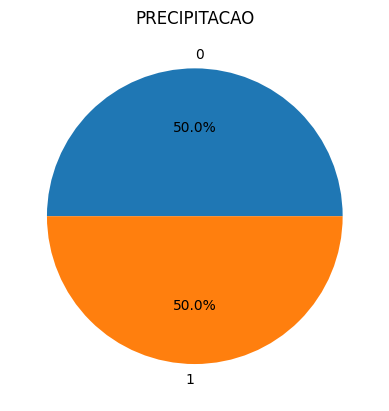

In [577]:

#Count the occurrences of 'CHOVE' and 'NÃO CHOVE'
counts = df_balanceado['PRECIPITACAO'].value_counts()

#Create a pie chart
plt.pie(counts, labels=counts.index, autopct='%1.1f%%')

# # Add a title
plt.title('PRECIPITACAO')

# # Display the chart
plt.show()


# Utilizando o algoritmo de correlação de Spearman

## DataFrame desbalanceado

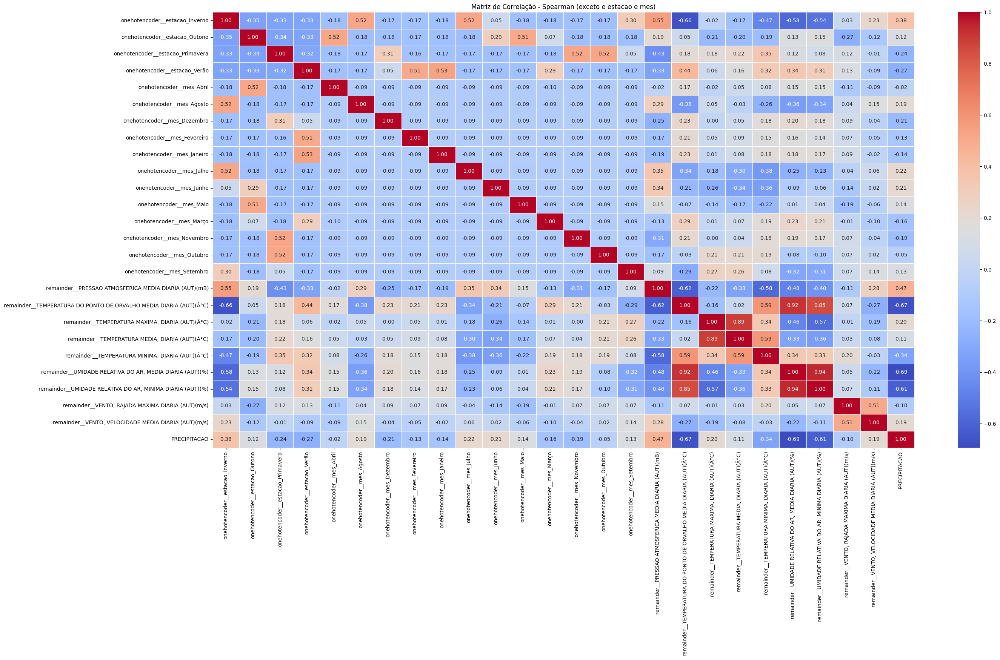

In [578]:
df_desbalanceado = pd.DataFrame(x, columns=x.columns)
df_desbalanceado['PRECIPITACAO'] = y


# Calcular a correlação de Spearman
correlation_matrix_spearman = df_desbalanceado.corr(method='spearman')

# Visualização da matriz de correlação de Spearman
plt.figure(figsize=(30, 15))
sns.heatmap(correlation_matrix_spearman, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Matriz de Correlação - Spearman (exceto e estacao e mes)')
plt.show()



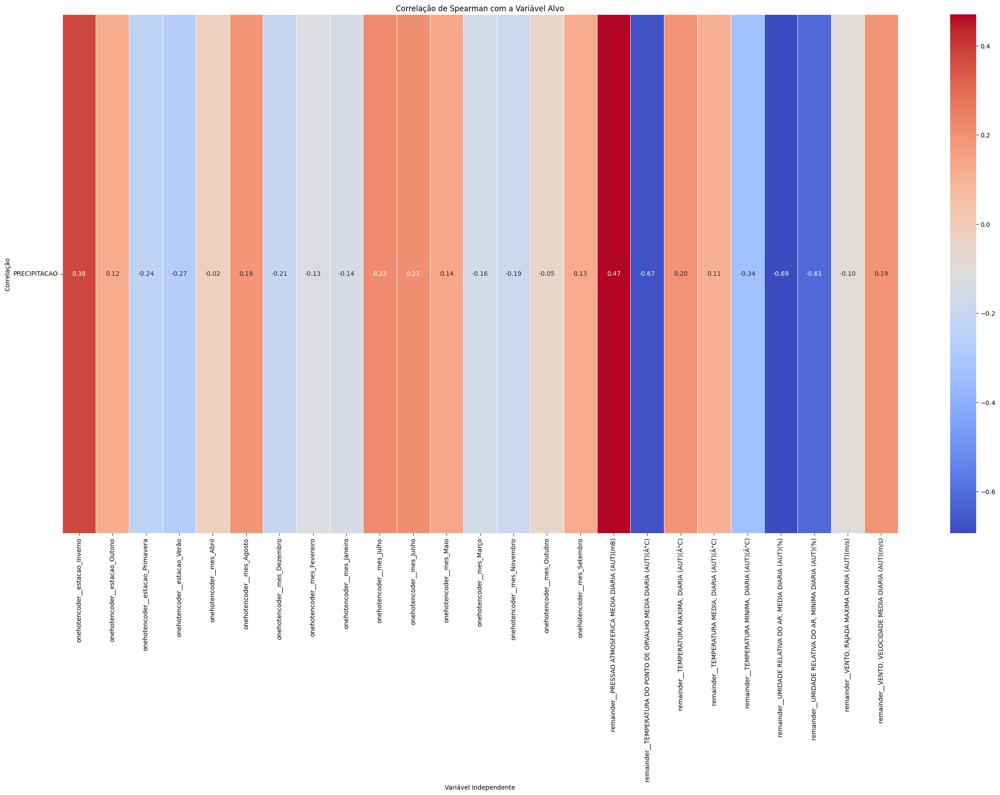

In [579]:
# Selecionar apenas a coluna da variável alvo
target_variable = df_desbalanceado['PRECIPITACAO']

# Calcular a correlação de Spearman entre a variável alvo e as outras variáveis independentes
correlation_with_target = df_desbalanceado.drop(columns=['PRECIPITACAO']).corrwith(target_variable, method='spearman')

# Criar um dataframe com a correlação entre a variável alvo e as variáveis independentes
correlation_df = pd.DataFrame(correlation_with_target, columns=['PRECIPITACAO'])

# Plotar um heatmap da correlação
plt.figure(figsize=(30, 15))
sns.heatmap(correlation_df.transpose(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlação de Spearman com a Variável Alvo')
plt.xlabel('Variável Independente')
plt.ylabel('Correlação')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()


## DataFrame Balanceado

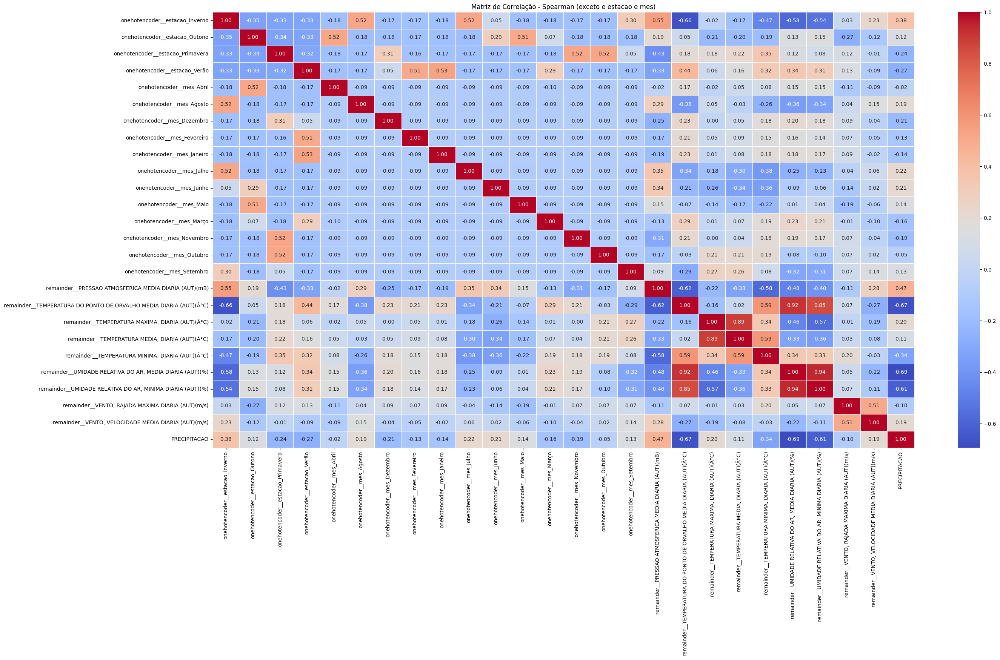

In [580]:
# Calcular a correlação de Spearman
correlation_matrix_spearman = df_desbalanceado.corr(method='spearman')

# Visualização da matriz de correlação de Spearman
plt.figure(figsize=(30, 15))
sns.heatmap(correlation_matrix_spearman, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Matriz de Correlação - Spearman (exceto e estacao e mes)')
plt.show()



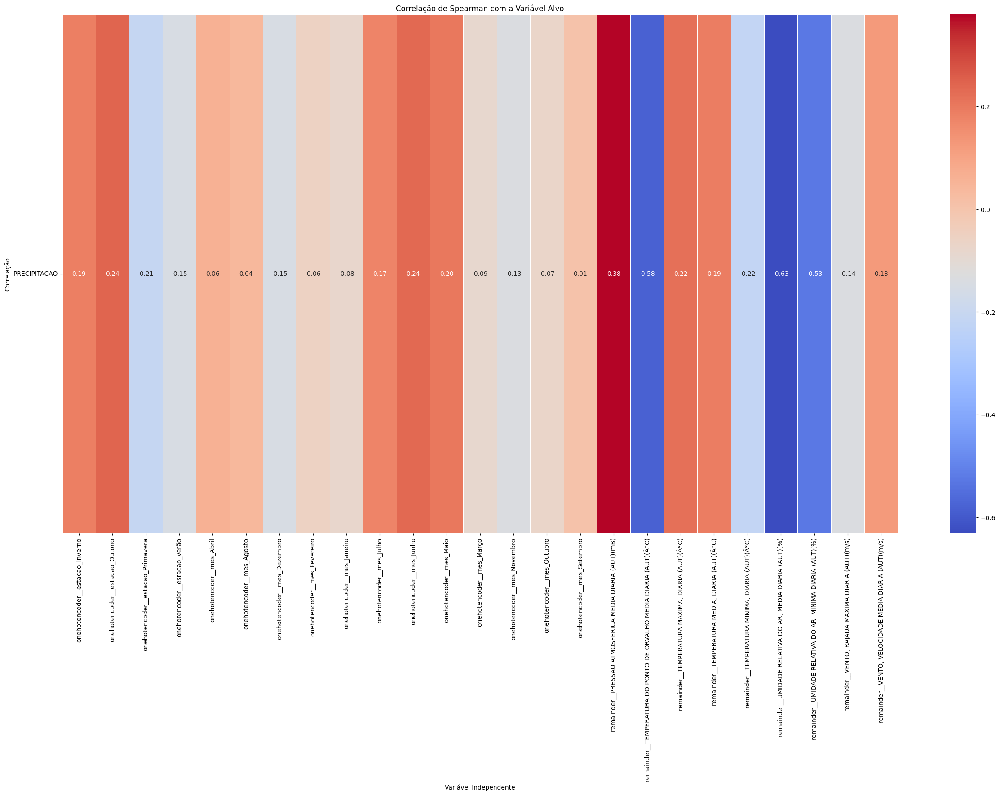

In [581]:
# Selecionar apenas a coluna da variável alvo
target_variable = df_balanceado['PRECIPITACAO']

# Calcular a correlação de Spearman entre a variável alvo e as outras variáveis independentes
correlation_with_target = df_balanceado.drop(columns=['PRECIPITACAO']).corrwith(target_variable, method='spearman')

# Criar um dataframe com a correlação entre a variável alvo e as variáveis independentes
correlation_df = pd.DataFrame(correlation_with_target, columns=['PRECIPITACAO'])

# Plotar um heatmap da correlação
plt.figure(figsize=(30, 15))
sns.heatmap(correlation_df.transpose(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlação de Spearman com a Variável Alvo')
plt.xlabel('Variável Independente')
plt.ylabel('Correlação')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()


# Testando Modelos de Machine Learning

## Dividindo os dados entre treino e teste

Para compreender se o modelo está de fato aprendendo com os dados, precisamos fazer uma separação dos dados entre treinamento e teste. Os dados de treinamento são usados para ajustar o modelo, enquanto os dados de teste servem para verificar o aprendizado do modelo em dados que não foram utilizados no momento do ajuste.

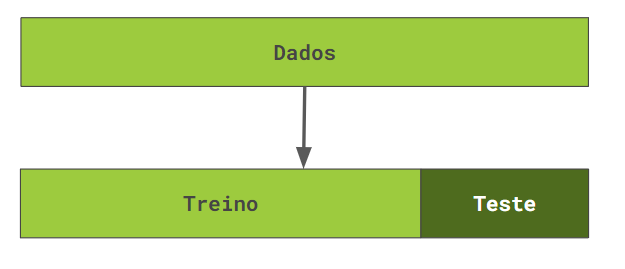

In [582]:
#importando a função que separa a base de dados em train e teste
from sklearn.model_selection import train_test_split

### DataFrame Desbalanceado

In [583]:
# criando as variaveis que irão armazenar as variaveis explicativas e variaveis alvos de treino e teste
#primeiros parametros variavel explicativa e variavel alvo
# Stratify mantem a mesma proporção de dados da variavel y tanto no dados de treinamento quanto de teste
# separação de dados de forma aleátorio 75% para treino 25% para teste
x_treino, x_teste, y_treino, y_teste = train_test_split(x, y, stratify = y,  random_state = 5)

### DataFrame Balanceado

In [584]:
# criando as variaveis que irão armazenar as variaveis explicativas e variaveis alvos de treino e teste
#primeiros parametros variavel explicativa e variavel alvo
# Stratify mantem a mesma proporção de dados da variavel y tanto no dados de treinamento quanto de teste
# separação de dados de forma aleátorio 75% para treino 25% para teste
x_treino_balan, x_teste_balan, y_treino_balan, y_teste_balan = train_test_split(X_res, y_res, stratify = y_res,  random_state = 5)

## Modelo de base

O modelo mais simples de classificar os dados é simplesmente utilizar um algoritmo que chuta todas as classificações para a classe que tem maior frequência. Esse algoritmo serve como um critério de comparação, para identificar se os outros modelos tem um desempenho melhor do que a classificação mais simples possível.

### DataFrame desbalanceado

In [585]:
from sklearn.dummy import DummyClassifier
#Inicializando o modelo e armazenando em uma variável
dummy = DummyClassifier()

dummy.fit(x_treino, y_treino)

dummy.score(x_teste, y_teste)

0.6371120962634579

### DataFrame Balanceado

In [586]:
from sklearn.dummy import DummyClassifier
#Inicializando o modelo e armazenando em uma variável
dummy_balan = DummyClassifier()

dummy_balan.fit(x_treino_balan, y_treino_balan)

dummy_balan.score(x_teste_balan, y_teste_balan)

0.4995633187772926

## Árvore de decisão

O modelo de árvore de decisão é muito utilizado pela sua alta **explicabilidade** e **processamento rápido**, mantendo um desempenho bem interessante.

Ele se baseia em decisões simples tomadas pelo algoritmo, separando os dados com base em comparações de **menor** e **maior** nos valores das colunas da base de dados.

Basicamente, a árvore compara se um valor é maior ou menor a partir dos valores de uma coluna do dataframe, e separa os dados com base no resultado dessa comparação. Portanto, aqueles dados que tiverem um valor maior que o valor estipulado pela árvore serão separados em um grupo, e aqueles que tiverem um valor menor serão separados em um grupo diferente.

No entanto, a escolha de qual coluna e o valor de comparação serão controlados para tomar uma boa decisão. Isso é controlado pelo índice de Gini, um cálculo realizado para determinar a melhor separação possível, ou seja, aquela que vai dividir a maior quantidade possível de dados das duas classes da variável alvo. Portanto, são testadas várias comparações de valores e colunas, e o melhor índice de Gini determina a escolha feita pela árvore final.

### DataFrame desbalanceado

In [587]:
from sklearn.tree import DecisionTreeClassifier

#Inicializando o Modelo
arvore = DecisionTreeClassifier(criterion='gini',max_depth = 6, random_state =5, splitter='best')
arvore.fit(x_treino, y_treino)

DecisionTreeClassifier(max_depth=6, random_state=5)

Com o modelo ajustado, podemos fazer uma previsão. Para isso, utilizamos a função predict(). Ela faz previsões de novos dados a partir da regra criada pela árvore. Vamos utilizar os dados de teste para fazer essas previsões e verificar os resultados da classificação pela árvore.

In [588]:
#Verificando o desempenho do novo modelo
arvore.score(x_treino, y_treino)

0.8872228088701162

In [589]:
#Comparando o resultado(taxa de acerto) com o y_teste que e o gabarito para ver a taixa de acerto
arvore.score(x_teste, y_teste)


0.8581380620645979

### Visualizando a regra criada pela arvore

In [590]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt
# variaveis explicativas
nome_colunas = ['onehotencoder__estacao_Inverno', 'onehotencoder__estacao_Outono',
       'onehotencoder__estacao_Primavera', 'onehotencoder__estacao_Verão',
       'onehotencoder__mes_Abril', 'onehotencoder__mes_Agosto',
       'onehotencoder__mes_Dezembro', 'onehotencoder__mes_Fevereiro',
       'onehotencoder__mes_Janeiro', 'onehotencoder__mes_Julho',
       'onehotencoder__mes_Junho', 'onehotencoder__mes_Maio',
       'onehotencoder__mes_Março', 'onehotencoder__mes_Novembro',
       'onehotencoder__mes_Outubro', 'onehotencoder__mes_Setembro',
       'remainder__PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)',
       'remainder__TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)',
       'remainder__TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)',
       'remainder__TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)',
       'remainder__TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)',
       'remainder__UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)',
       'remainder__UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)','remainder__VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)',
       'remainder__VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)']


In [591]:
plt.figure(figsize = (160, 80))
plot_tree(arvore, filled = True, class_names = ['Não chove', 'Chove'], fontsize = 15, feature_names = nome_colunas);

### Matriz de Confusão

Matriz de Confusão:
[[491  82]
 [142 864]]


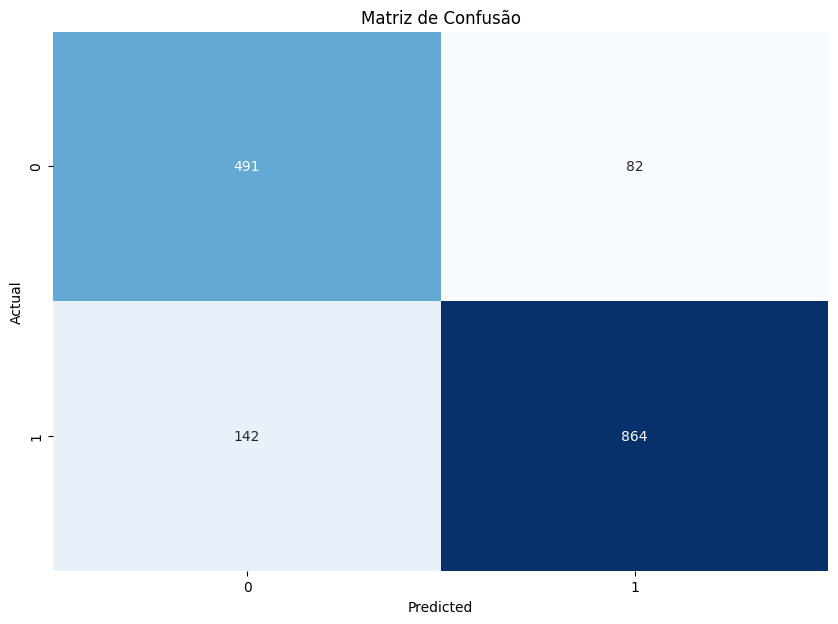


Relatório de Classificação:
              precision    recall  f1-score   support

           0       0.78      0.86      0.81       573
           1       0.91      0.86      0.89      1006

    accuracy                           0.86      1579
   macro avg       0.84      0.86      0.85      1579
weighted avg       0.86      0.86      0.86      1579



In [592]:
from sklearn.metrics import confusion_matrix, classification_report
# Prever no conjunto de teste
y_pred = arvore.predict(x_teste)

# Calcular a matriz de confusão
cm = confusion_matrix(y_teste, y_pred)

# Imprimir a matriz de confusão
print('Matriz de Confusão:')
print(cm)

# Visualizar a matriz de confusão com seaborn
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Matriz de Confusão')
plt.show()

# Imprimir relatório de classificação para mais detalhes
print('\nRelatório de Classificação:')
print(classification_report(y_teste, y_pred))

### Características mais importantes

In [593]:
# Calcular a importância das características
importancias = arvore.feature_importances_

# Ordenar importâncias das características
indices = np.argsort(importancias)[::-1]

# Imprimir as características por ordem de importância
print("\nImportância das Características:")
for i in range(x_treino.shape[1]):
    print(f"{i + 1}. {x_treino.columns[indices[i]]} ({importancias[indices[i]]})")


Importância das Características:
1. remainder__UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%) (0.8069724517923156)
2. remainder__TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C) (0.06882706276680531)
3. onehotencoder__estacao_Outono (0.029039654802697507)
4. remainder__TEMPERATURA MINIMA, DIARIA (AUT)(Â°C) (0.02319520282778213)
5. onehotencoder__estacao_Primavera (0.01579188891716376)
6. remainder__UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%) (0.012469133008686697)
7. remainder__PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB) (0.010161218749090508)
8. remainder__VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s) (0.00986500540143731)
9. onehotencoder__mes_Setembro (0.007220155979666647)
10. onehotencoder__mes_Agosto (0.004609081555953504)
11. onehotencoder__mes_Junho (0.0033498972020707413)
12. onehotencoder__mes_Outubro (0.003342204874963792)
13. onehotencoder__mes_Março (0.002046695315599822)
14. remainder__TEMPERATURA MEDIA, DIARIA (AUT)(Â°C) (0.002014376562483401)
15. remainder__VENTO, 

### DataFrame balanceado

In [594]:
#Inicializando o Modelo
arvore_balan = DecisionTreeClassifier(criterion='gini',max_depth = 6, random_state =5, splitter='best')
arvore_balan.fit(x_treino_balan, y_treino_balan)

DecisionTreeClassifier(max_depth=6, random_state=5)

In [595]:
#Verificando o desempenho do novo modelo
arvore_balan.score(x_treino_balan, y_treino_balan)

0.8564774381368268

In [596]:
#Comparando o resultado(taxa de acerto) com o y_teste que e o gabarito para ver a taixa de acerto
arvore_balan.score(x_teste_balan, y_teste_balan)

0.7834061135371179

### Visualizando a regra criada pela arvore

In [597]:
plt.figure(figsize = (160, 80))
plot_tree(arvore_balan, filled = True, class_names = ['Não chove', 'Chove'], fontsize = 15, feature_names = nome_colunas);

### Matriz de Confusão

Matriz de Confusão:
[[497  75]
 [173 400]]


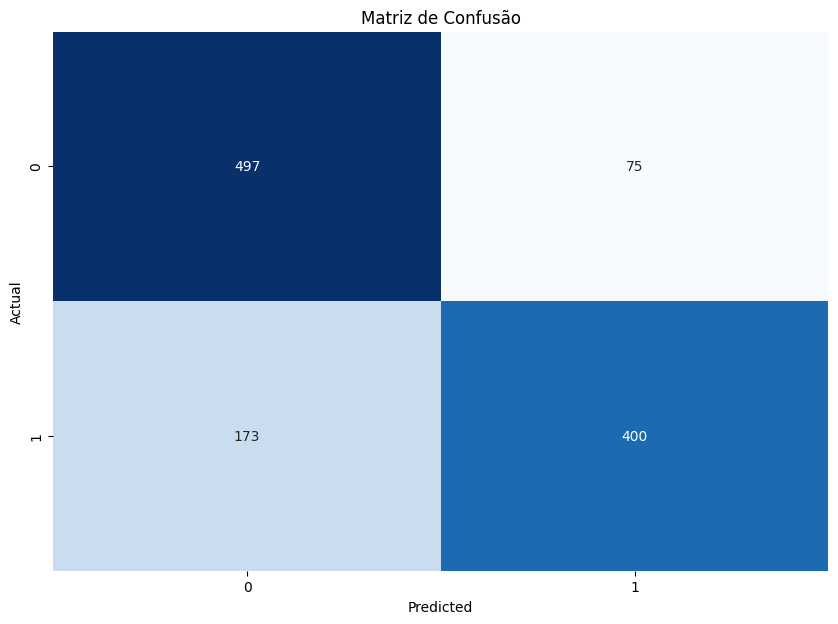


Relatório de Classificação:
              precision    recall  f1-score   support

           0       0.74      0.87      0.80       572
           1       0.84      0.70      0.76       573

    accuracy                           0.78      1145
   macro avg       0.79      0.78      0.78      1145
weighted avg       0.79      0.78      0.78      1145



In [598]:
from sklearn.metrics import confusion_matrix, classification_report
# Prever no conjunto de teste
y_pred = arvore_balan.predict(x_teste_balan)

# Calcular a matriz de confusão
cm = confusion_matrix(y_teste_balan, y_pred)

# Imprimir a matriz de confusão
print('Matriz de Confusão:')
print(cm)

# Visualizar a matriz de confusão com seaborn
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Matriz de Confusão')
plt.show()

# Imprimir relatório de classificação para mais detalhes
print('\nRelatório de Classificação:')
print(classification_report(y_teste_balan, y_pred))

### Características mais importantes

In [599]:
# Calcular a importância das características
importancias = arvore_balan.feature_importances_

# Ordenar importâncias das características
indices = np.argsort(importancias)[::-1]

# Imprimir as características por ordem de importância
print("\nImportância das Características:")
for i in range(x_treino.shape[1]):
    print(f"{i + 1}. {x_treino.columns[indices[i]]} ({importancias[indices[i]]})")



Importância das Características:
1. remainder__UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%) (0.7675591725675192)
2. remainder__TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C) (0.037902605310397276)
3. onehotencoder__estacao_Primavera (0.03657327242789838)
4. onehotencoder__estacao_Outono (0.034643369625629666)
5. remainder__TEMPERATURA MINIMA, DIARIA (AUT)(Â°C) (0.026323188639953362)
6. remainder__UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%) (0.022701503439345086)
7. remainder__VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s) (0.016129710218110164)
8. remainder__PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB) (0.015584485313256005)
9. remainder__TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C) (0.011786565759315146)
10. onehotencoder__mes_Setembro (0.009424667726387684)
11. remainder__VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s) (0.007362007251272287)
12. onehotencoder__mes_Agosto (0.007027274832438107)
13. onehotencoder__mes_Junho (0.0032008564782563045)
14. onehotencoder__mes_Outubro (0.0021123170485

## Testando o modelo que utilza rede neural aritificial

O MLPClassifier é um tipo de rede neural artificial (RNA) que se baseia em múltiplas camadas de nós (neurônios) totalmente conectados. Ele é utilizado principalmente para tarefas de classificação supervisionada, onde o objetivo é treinar um modelo que possa prever a classe de novas amostras de dados.

### DataFrame Desbalanceado

In [600]:
import warnings as wr
from sklearn import neural_network as nn
from sklearn.exceptions import ConvergenceWarning
from sklearn.exceptions import DataConversionWarning

mlp = nn.MLPClassifier(hidden_layer_sizes=(96,48 , 24), max_iter=1024, n_iter_no_change=512, 
                       alpha=1e-4, solver='lbfgs', verbose=10, random_state=1, learning_rate_init=0.5)

print('#################### EXECUCAO ####################')
print('Treinamento')

with wr.catch_warnings():
    wr.filterwarnings("ignore", category=ConvergenceWarning, module="sklearn")
    wr.filterwarnings("ignore", category=DataConversionWarning, module="sklearn")
    mlp.fit(x_treino, y_treino)
print('Treinamento Concluido')

#################### EXECUCAO ####################
Treinamento
Treinamento Concluido


In [601]:
mlp.score(x_treino, y_treino)

0.8743400211193242

In [602]:
mlp.score(x_teste, y_teste)

0.8606713109563014

### Matriz de Confusão

Matriz de Confusão:
[[466 107]
 [113 893]]


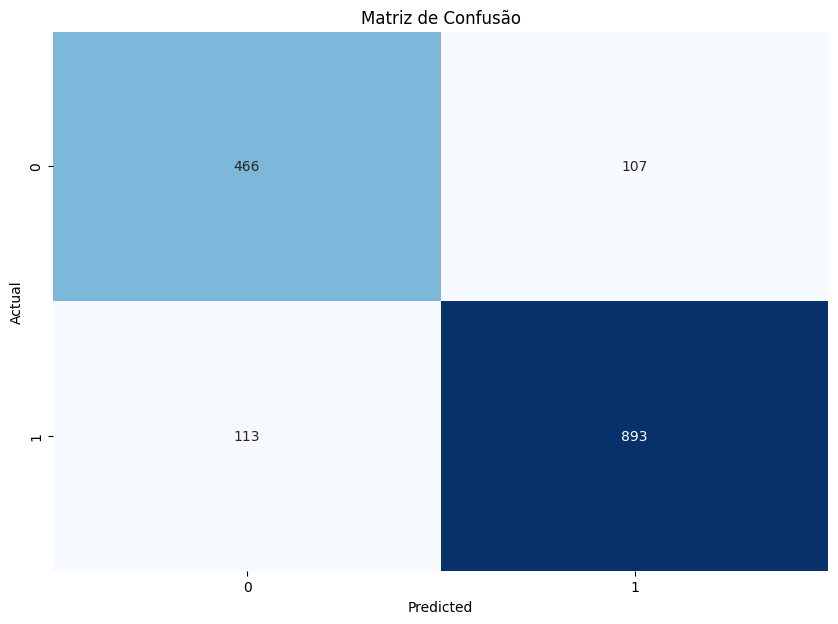


Relatório de Classificação:
              precision    recall  f1-score   support

           0       0.80      0.81      0.81       573
           1       0.89      0.89      0.89      1006

    accuracy                           0.86      1579
   macro avg       0.85      0.85      0.85      1579
weighted avg       0.86      0.86      0.86      1579



In [603]:
from sklearn.metrics import confusion_matrix, classification_report
# Prever no conjunto de teste
y_pred = mlp.predict(x_teste)

# Calcular a matriz de confusão
cm = confusion_matrix(y_teste, y_pred)

# Imprimir a matriz de confusão
print('Matriz de Confusão:')
print(cm)

# Visualizar a matriz de confusão com seaborn
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Matriz de Confusão')
plt.show()

# Imprimir relatório de classificação para mais detalhes
print('\nRelatório de Classificação:')
print(classification_report(y_teste, y_pred))

### Características mais importantes

In [604]:
from sklearn.inspection import permutation_importance

# Calcular a importância das características usando Permutation Importance
result = permutation_importance(mlp, x_teste, y_teste, n_repeats=10, random_state=1, n_jobs=-1)

# Ordenar importâncias das características
importancias = result.importances_mean
indices = np.argsort(importancias)[::-1]

# Imprimir as características por ordem de importância
print("\nImportância das Características:")
for i in range(x_treino.shape[1]):
    print(f"{i + 1}. {x_treino.columns[indices[i]]} ({importancias[indices[i]]})")



Importância das Características:
1. remainder__UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%) (0.4006966434452185)
2. remainder__TEMPERATURA MEDIA, DIARIA (AUT)(Â°C) (0.015516149461684604)
3. remainder__UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%) (0.010766307789740349)
4. remainder__TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C) (0.010449651678277383)
5. onehotencoder__estacao_Outono (0.004686510449651659)
6. remainder__VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s) (0.002596580113996205)
7. remainder__TEMPERATURA MINIMA, DIARIA (AUT)(Â°C) (0.001963267891070275)
8. onehotencoder__estacao_Primavera (0.0013932868904369734)
9. onehotencoder__mes_Outubro (0.0008233058898036605)
10. onehotencoder__mes_Janeiro (0.0006333122229258747)
11. remainder__TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C) (0.0005699810006332906)
12. onehotencoder__mes_Junho (0.0004433185560481223)
13. onehotencoder__mes_Maio (0.00025332488917033656)
14. onehotencoder__mes_Fevereiro (0.00018999366687775244)
15. onehotencoder

### DataFrame Balanceado

In [605]:
import warnings as wr
from sklearn import neural_network as nn
from sklearn.exceptions import ConvergenceWarning
from sklearn.exceptions import DataConversionWarning

mlp_balan = nn.MLPClassifier(hidden_layer_sizes=(96,48 , 24), max_iter=1024, n_iter_no_change=512, 
                             alpha=1e-4, solver='lbfgs', verbose=10, random_state=1, learning_rate_init=0.5)

print('#################### EXECUCAO ####################')
print('Treinamento')

with wr.catch_warnings():
    wr.filterwarnings("ignore", category=ConvergenceWarning, module="sklearn")
    wr.filterwarnings("ignore", category=DataConversionWarning, module="sklearn")
    mlp_balan.fit(x_treino_balan, y_treino_balan)
print('Treinamento Concluido')

#################### EXECUCAO ####################
Treinamento
Treinamento Concluido


In [606]:
mlp_balan.score(x_treino_balan, y_treino_balan)

0.8328966521106259

In [607]:
mlp_balan.score(x_teste_balan, y_teste_balan)

0.8026200873362446

### Matriz de Confusão

Matriz de Confusão:
[[467 105]
 [121 452]]


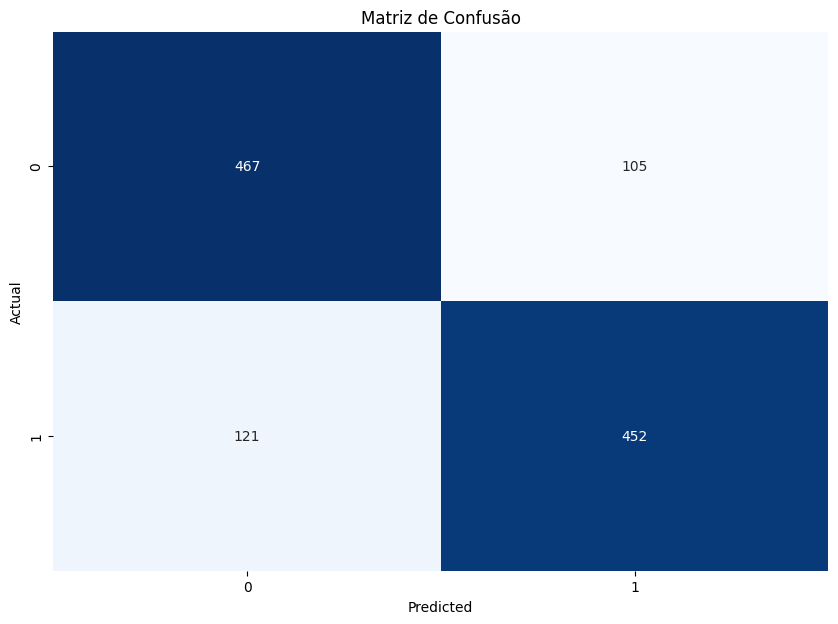


Relatório de Classificação:
              precision    recall  f1-score   support

           0       0.79      0.82      0.81       572
           1       0.81      0.79      0.80       573

    accuracy                           0.80      1145
   macro avg       0.80      0.80      0.80      1145
weighted avg       0.80      0.80      0.80      1145



In [608]:
from sklearn.metrics import confusion_matrix, classification_report
# Prever no conjunto de teste
y_pred = mlp_balan.predict(x_teste_balan)

# Calcular a matriz de confusão
cm = confusion_matrix(y_teste_balan, y_pred)

# Imprimir a matriz de confusão
print('Matriz de Confusão:')
print(cm)

# Visualizar a matriz de confusão com seaborn
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Matriz de Confusão')
plt.show()

# Imprimir relatório de classificação para mais detalhes
print('\nRelatório de Classificação:')
print(classification_report(y_teste_balan, y_pred))

### Características mais importantes

In [609]:
from sklearn.inspection import permutation_importance

# Calcular a importância das características usando Permutation Importance
result = permutation_importance(mlp_balan, x_teste_balan, y_teste_balan, n_repeats=10, random_state=1, n_jobs=-1)

# Ordenar importâncias das características
importancias = result.importances_mean
indices = np.argsort(importancias)[::-1]

# Imprimir as características por ordem de importância
print("\nImportância das Características:")
for i in range(x_treino.shape[1]):
    print(f"{i + 1}. {x_treino.columns[indices[i]]} ({importancias[indices[i]]})")



Importância das Características:
1. remainder__UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%) (0.36882096069869)
2. remainder__TEMPERATURA MEDIA, DIARIA (AUT)(Â°C) (0.04829694323144109)
3. remainder__TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C) (0.027423580786026237)
4. remainder__UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%) (0.024017467248908332)
5. remainder__TEMPERATURA MINIMA, DIARIA (AUT)(Â°C) (0.014847161572052426)
6. onehotencoder__estacao_Outono (0.014061135371179067)
7. onehotencoder__estacao_Primavera (0.013624454148471642)
8. remainder__TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C) (0.005240174672489129)
9. onehotencoder__mes_Junho (0.005240174672489106)
10. onehotencoder__mes_Maio (0.004716157205240201)
11. onehotencoder__mes_Janeiro (0.0038427947598253633)
12. remainder__PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB) (0.0032314410480349777)
13. remainder__VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s) (0.0025327510917030893)
14. onehotencoder__estacao_Verão (0.0019213973799126927

## Exportando o melhor Modelo

Podemos armazenar o modelo em um arquivo serializado do tipo pickle para que seja utilizado em produção, ou seja, em dados do mundo real para atender as necessidades do problema que precisa ser resolvido.

### Verificação da Acurácia

In [610]:
# Verificando a taxa de acerto de cada um dos modelos
acuracia_dummy_desbalanceado = dummy.score(x_teste, y_teste)
acuracia_arvore_desbalanceado = arvore.score(x_teste, y_teste)
acuracia_mlp_desbalanceado = mlp.score(x_teste, y_teste)

acuracia_dummy_balanceado = dummy_balan.score(x_teste_balan, y_teste_balan)
acuracia_arvore_balanceado = arvore_balan.score(x_teste_balan, y_teste_balan)
acuracia_mlp_balanceado = mlp_balan.score(x_teste_balan, y_teste_balan)


#Verificando a taxa de acerto de cada um dos modelos
print("Dataframe Desbalanceado")
print(f'Acurácia Dummy: {acuracia_dummy_desbalanceado}')
print(f'Acurácia Árvore: {acuracia_arvore_desbalanceado}')
print(f'Acurácia MLP: {acuracia_mlp_desbalanceado}')
print('\nDataFrame Balanceado')

print(f'Acurácia Dummy: {acuracia_dummy_balanceado}')
print(f'Acurácia Árvore: {acuracia_arvore_balanceado}')
print(f'Acurácia MLP: {acuracia_mlp_balanceado}')

Dataframe Desbalanceado
Acurácia Dummy: 0.6371120962634579
Acurácia Árvore: 0.8581380620645979
Acurácia MLP: 0.8606713109563014

DataFrame Balanceado
Acurácia Dummy: 0.4995633187772926
Acurácia Árvore: 0.7834061135371179
Acurácia MLP: 0.8026200873362446


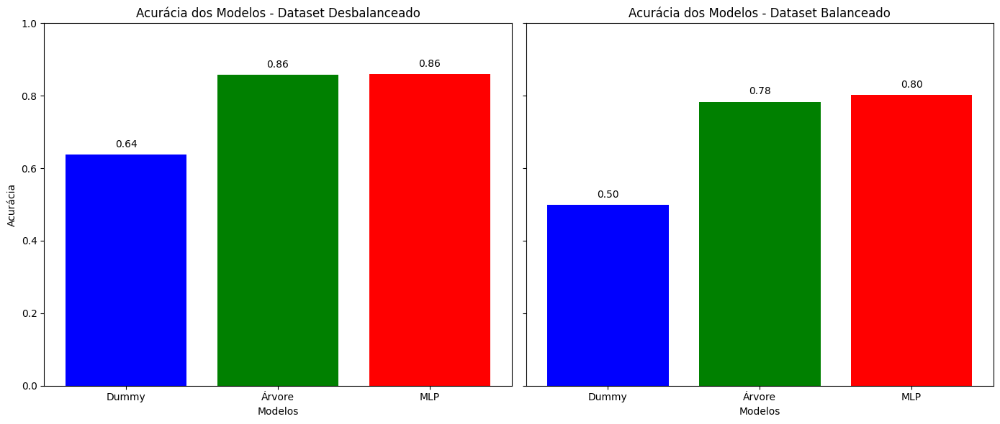

In [611]:
# Dados para os gráficos
modelos = ['Dummy', 'Árvore', 'MLP']
acuracias_desbalanceado = [acuracia_dummy_desbalanceado, acuracia_arvore_desbalanceado, acuracia_mlp_desbalanceado]
acuracias_balanceado = [acuracia_dummy_balanceado, acuracia_arvore_balanceado, acuracia_mlp_balanceado]

# Plotando os gráficos
fig, ax = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Gráfico para datasets desbalanceados
ax[0].bar(modelos, acuracias_desbalanceado, color=['blue', 'green', 'red'])
ax[0].set_title('Acurácia dos Modelos - Dataset Desbalanceado')
ax[0].set_xlabel('Modelos')
ax[0].set_ylabel('Acurácia')
ax[0].set_ylim(0, 1)  # Para garantir a mesma escala em ambos os gráficos
for i, v in enumerate(acuracias_desbalanceado):
    ax[0].text(i, v + 0.02, f"{v:.2f}", ha='center')

# Gráfico para datasets balanceados
ax[1].bar(modelos, acuracias_balanceado, color=['blue', 'green', 'red'])
ax[1].set_title('Acurácia dos Modelos - Dataset Balanceado')
ax[1].set_xlabel('Modelos')
ax[1].set_ylim(0, 1)  # Para garantir a mesma escala em ambos os gráficos
for i, v in enumerate(acuracias_balanceado):
    ax[1].text(i, v + 0.02, f"{v:.2f}", ha='center')

plt.tight_layout()
plt.show()

### Pickle

Depois de criar os modelos de machine learning, comparar os resultados e selecionar aquele que obteve o melhor desempenho, é o momento de utilizar o modelo para classificar novos dados do mundo real, que é desde o princípio o objetivo real do projeto. Acontece que o modelo geralmente é construído em um notebook e o ambiente em que vai ser utilizado o modelo é diferente, em algum aplicativo, site ou sistema.

Para poder utilizar o modelo, é necessário exportá-lo, e é nesse momento que entra em cena o pickle. O módulo pickle em Python é uma ferramenta poderosa e versátil que permite a serialização e desserialização de objetos Python. Esse processo de serialização envolve a conversão de objetos Python em uma representação binária que pode ser armazenada em um arquivo. Mais tarde, essa representação pode ser desserializada para recriar o objeto original.

Assim, é possível armazenar modelos de machine learning em arquivos pickle, para que possam ser utilizados em outros programas. Ele preserva completamente o estado do objeto, incluindo todos os parâmetros e configurações. Além disso, o formato binário gerado pelo pickle é independente da plataforma, o que significa que é possível criar um arquivo em um sistema operacional e carregá-lo em outro sem problema de compatibilidade. Vale destacar que em versões diferentes do Python isto pode ser um problema.

In [612]:
import pickle

In [613]:
with open('modelo_onehotenc.pkl', 'wb') as arquivo:
    pickle.dump(one_hot, arquivo)

In [614]:
with open('modelo_mlp.pkl', 'wb') as arquivo:
    pickle.dump(mlp, arquivo)

In [615]:
#aplicando o modelo em novos dados
#verificando o formato dos dados para passar da mesma forma
df

,PRECIPITACAO,PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)",mes,estacao
0,CHOVE,885.4,18.8,24.6,20.7,18.7,89.3,69.0,7.4,1.7,Janeiro,Verão
1,CHOVE,885.9,18.3,24.7,20.7,18.5,87.0,67.0,9.0,2.4,Janeiro,Verão
14,NÃO CHOVE,888.0,14.4,27.2,22.0,17.8,63.0,41.0,10.8,3.8,Janeiro,Verão
15,NÃO CHOVE,887.9,13.7,26.3,21.8,17.7,61.2,35.0,10.6,4.3,Janeiro,Verão
16,NÃO CHOVE,888.1,15.0,27.4,21.9,18.1,66.0,41.0,8.4,3.5,Janeiro,Verão
...,...,...,...,...,...,...,...,...,...,...,...,...
6934,NÃO CHOVE,887.0,17.0,28.5,23.8,19.6,67.7,43.0,9.7,2.9,Dezembro,Verão
6935,CHOVE,886.4,15.4,29.0,23.9,19.3,60.5,32.0,8.9,3.0,Dezembro,Verão
6936,NÃO CHOVE,885.4,15.2,29.8,24.2,18.4,59.5,34.0,7.8,2.5,Dezembro,Verão
6937,NÃO CHOVE,884.0,15.1,29.1,24.0,18.4,58.7,38.0,8.1,2.2,Dezembro,Verão


## Testando o modelo em novos dados

In [616]:
#Dados previstos para o dia 06 de junho de 2024 para brasilia (dia atual da coleta 17 de maio de 2024)
novo_dado = {
    'PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)': [1021.0],
    'TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)': [12],
    'TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)': [27],
    'TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)': [20],
    'TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)': [14],
    'UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)': [68.9],
    'UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)': [46],
    'VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)': [22],
    'VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)':[15],
    'mes': ['Junho'],
    'estacao': ['Outono']

}

novo_dado = pd.DataFrame(novo_dado)
novo_dado

,PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)",mes,estacao
0,1021.0,12,27,20,14,68.9,46,22,15,Junho,Outono


In [617]:
#importando o modelo de one hot encoder e o de arvore de decisao
modelo_one_hot = pd.read_pickle('.\\modelo_onehotenc.pkl')
modelo_mlp = pd.read_pickle('.\\modelo_mlp.pkl')

In [618]:
modelo_one_hot

ColumnTransformer(remainder='passthrough', sparse_threshold=0,
                  transformers=[('onehotencoder',
                                 OneHotEncoder(drop='if_binary'),
                                 ['estacao', 'mes'])])

In [619]:
modelo_mlp

MLPClassifier(hidden_layer_sizes=(96, 48, 24), learning_rate_init=0.5,
              max_iter=1024, n_iter_no_change=512, random_state=1,
              solver='lbfgs', verbose=10)

In [620]:
novo_dado = modelo_one_hot.transform(novo_dado)

In [621]:
novo_dado = pd.DataFrame(novo_dado)
novo_dado

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1021.0,12.0,27.0,20.0,14.0,68.9,46.0,22.0,15.0


In [622]:
# Essa Etepa não precisa acontecer para o modelo funcionar apenas fiz para testes pois sem ela estava emitindo um warning na chamda do modelo de arvore pois estava faltando os nomes das colunas
# mas como o modelo já foi previamente treinado ele sabe a ordem específica das colunas em que foi treinando então mesmo elas não possuindo nomes ele ainda funciona


# variaveis explicativas
nome_colunas = ['onehotencoder__estacao_Inverno', 'onehotencoder__estacao_Outono',
       'onehotencoder__estacao_Primavera', 'onehotencoder__estacao_Verão',
       'onehotencoder__mes_Abril', 'onehotencoder__mes_Agosto',
       'onehotencoder__mes_Dezembro', 'onehotencoder__mes_Fevereiro',
       'onehotencoder__mes_Janeiro', 'onehotencoder__mes_Julho',
       'onehotencoder__mes_Junho', 'onehotencoder__mes_Maio',
       'onehotencoder__mes_Março', 'onehotencoder__mes_Novembro',
       'onehotencoder__mes_Outubro', 'onehotencoder__mes_Setembro',
       'remainder__PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB)',
       'remainder__TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C)',
       'remainder__TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)',
       'remainder__TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)',
       'remainder__TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)',
       'remainder__UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)',
       'remainder__UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)','remainder__VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)',
       'remainder__VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)']

novo_dado.columns = nome_colunas
novo_dado

,onehotencoder__estacao_Inverno,onehotencoder__estacao_Outono,onehotencoder__estacao_Primavera,onehotencoder__estacao_Verão,onehotencoder__mes_Abril,onehotencoder__mes_Agosto,onehotencoder__mes_Dezembro,onehotencoder__mes_Fevereiro,onehotencoder__mes_Janeiro,onehotencoder__mes_Julho,...,onehotencoder__mes_Setembro,remainder__PRESSAO ATMOSFERICA MEDIA DIARIA (AUT)(mB),remainder__TEMPERATURA DO PONTO DE ORVALHO MEDIA DIARIA (AUT)(Â°C),"remainder__TEMPERATURA MAXIMA, DIARIA (AUT)(Â°C)","remainder__TEMPERATURA MEDIA, DIARIA (AUT)(Â°C)","remainder__TEMPERATURA MINIMA, DIARIA (AUT)(Â°C)","remainder__UMIDADE RELATIVA DO AR, MEDIA DIARIA (AUT)(%)","remainder__UMIDADE RELATIVA DO AR, MINIMA DIARIA (AUT)(%)","remainder__VENTO, RAJADA MAXIMA DIARIA (AUT)(m/s)","remainder__VENTO, VELOCIDADE MEDIA DIARIA (AUT)(m/s)"
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1021.0,12.0,27.0,20.0,14.0,68.9,46.0,22.0,15.0


In [623]:
modelo_mlp.predict(novo_dado)

array([1])